# IMAGE CLASSIFICATION & OBJECT DETECTION

# Import necessary libraries

In [1]:
# Install the plaidml backend to run keras locally
import plaidml.keras
plaidml.keras.install_backend()

import os

import numpy as np
import pandas as pd

# from numpy import expand_dims

import random

# Visualization of image and the model prediction
%matplotlib inline
import matplotlib.pyplot as plt
# from matplotlib.pyplot import imshow
# from matplotlib import pyplot
from matplotlib.patches import Rectangle

from PIL import Image

import struct

import keras
from keras.datasets import mnist
from keras.layers import BatchNormalization, Conv2D, Dense, Dropout, Flatten
from keras.layers import LeakyReLU, Input, MaxPooling2D, UpSampling2D, ZeroPadding2D
from keras.layers.merge import add, concatenate
from keras.models import load_model, model_from_json, Model, Sequential
from keras.preprocessing.image import load_img,img_to_array

In [2]:
def DatasetPrep(dir_dataset):
    x = []
    y = []
    size = 75, 75

    for category in keys:
        dir_root = dir_dataset
        photo_path = os.listdir(dir_root + category)
        for photo in photo_path:
            img = Image.open(dir_root + category + '/' + photo)
            img.thumbnail(size, Image.ANTIALIAS)
            img = np.array(img)
            
            x.append(img)
            y.append(categories[category])

    # Keep copy of original datasets
    orig_x = x
    orig_y = y
            
    # check for any pictures that are not shape (150, 150)
    off_images = []
    
    # get indices of all the images that are not (150, 150)
    for i in range(0,len(x)):
        if x[i].shape == (75, 75, 3):
            pass
        else:
            off_images.append(i)

    temporary_x = np.delete(x, off_images)
    temporary_y = np.delete(y, off_images)

    x = temporary_x
    y = temporary_y

    temp_x = np.array([temp.tolist() for temp in np.array(x)])
    temp_y = np.array(y)

    x = temp_x
    x = np.reshape(x, (x.shape[0], x[0].shape[0], x[0].shape[1], 3))
    
    y = temp_y
    
    return (x, y, orig_x, orig_y, off_images)

# Importing the Data

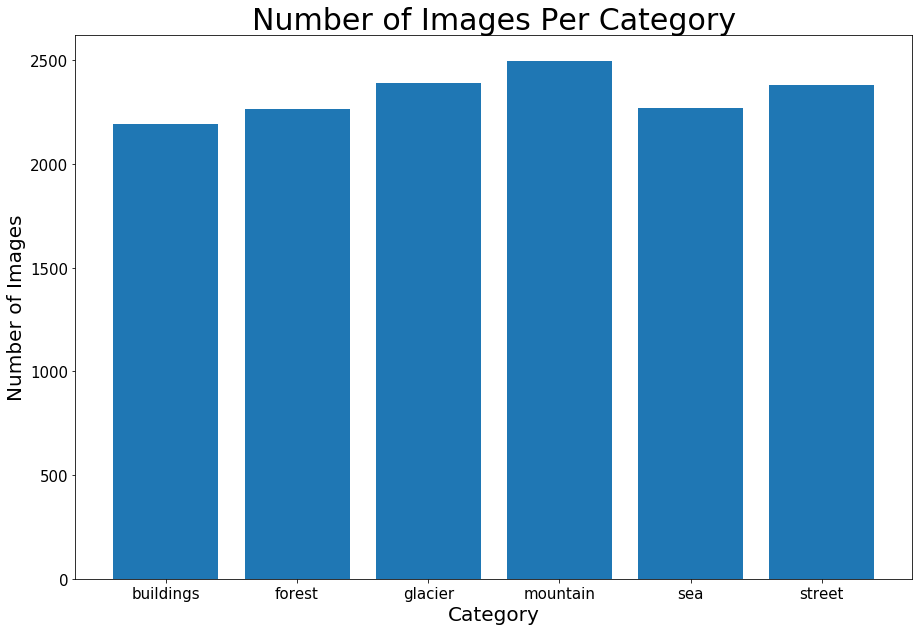

In [3]:
# Categories for image classification
keys = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
values = [1, 2, 3, 4, 5, 6]
categories = dict(zip(keys,values))
value_pair = dict(zip(values, keys))

# import training and test datasets
dir_train = 'seg_train/'
dir_test = 'seg_test/'

x_train, y_train, orig_x_train, orig_y_train, off_images_train = DatasetPrep(dir_train)
x_test, y_test, orig_x_test, orig_y_test, off_images_test = DatasetPrep(dir_test)

image_count = list(pd.Series(y_train).value_counts().sort_index().values)

# Plot number of images in training dataset for each cagetory
plt.figure(figsize = (15,10))
plt.bar(keys, image_count)
plt.title('Number of Images Per Category', fontsize=30)
plt.xlabel('Category', fontsize=20)
plt.ylabel('Number of Images', fontsize=20)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.show()

# Transforming data into proper format to input into model

In [4]:
num_classes = len(values)+1
y_train = keras.utils.to_categorical(y_train, num_classes=num_classes)

num_classes_test = len(np.unique(y_test))+1
y_test = keras.utils.to_categorical(y_test, num_classes=num_classes_test)

img_rows = x_train[0].shape[0]
img_cols = x_train[0].shape[1]
INPUT_SHAPE = (img_rows, img_cols,3)

# USING DEEP LEARNING TO CLASSIFY IMAGES
## Transfer learning: Using a pre-made model created by others along with weights created by me to classify picture

In [5]:
# load json and create model from pre-made model
json_file = open('model_ver8.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)

# load weights created by me into pre-model (transfer learning)
model.load_weights("model_ver8.h5")
print("Loaded model from disk")

INFO:plaidml:Opening device "metal_amd_radeon_pro_555.0"


Loaded model from disk


In [6]:
# evaluate loaded model on test data
model.compile(loss=keras.losses.categorical_crossentropy, 
                     optimizer='adam', 
                     metrics=['accuracy'])

# Evaluate accuracy of the model using test dataset

In [7]:
score = model.evaluate(x_test, y_test)
print("%s: %.2f" % (model.metrics_names[0], score[0]))
print("%s: %.2f%%" % (model.metrics_names[1], score[1]*100))

2993/2993 [==============================] - 15s 5ms/step
loss: 0.42
acc: 87.60%


# Evaluate the pictures that were incorrectly classified

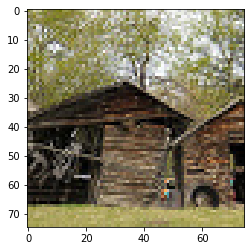

# 1   -   x_test[8]  Prediction:  2 - forest    Actual:  1 - buildings


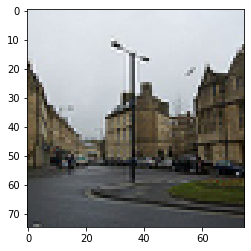

# 2   -   x_test[16]  Prediction:  6 - street    Actual:  1 - buildings


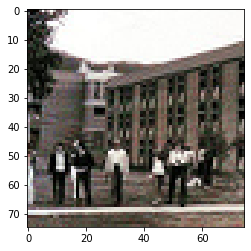

# 3   -   x_test[29]  Prediction:  6 - street    Actual:  1 - buildings


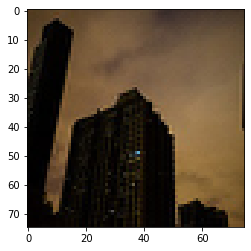

# 4   -   x_test[30]  Prediction:  5 - sea    Actual:  1 - buildings


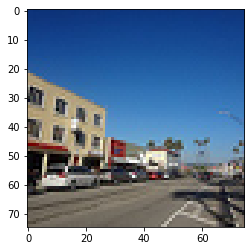

# 5   -   x_test[38]  Prediction:  6 - street    Actual:  1 - buildings


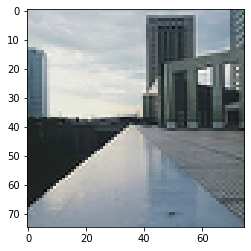

# 6   -   x_test[42]  Prediction:  6 - street    Actual:  1 - buildings


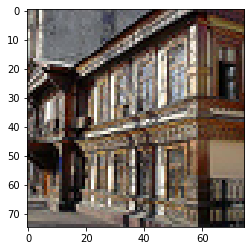

# 7   -   x_test[51]  Prediction:  6 - street    Actual:  1 - buildings


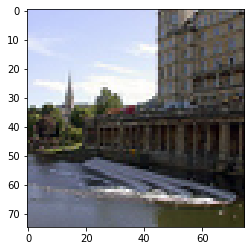

# 8   -   x_test[54]  Prediction:  6 - street    Actual:  1 - buildings


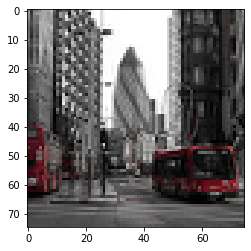

# 9   -   x_test[61]  Prediction:  6 - street    Actual:  1 - buildings


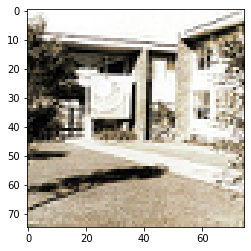

# 10   -   x_test[70]  Prediction:  6 - street    Actual:  1 - buildings


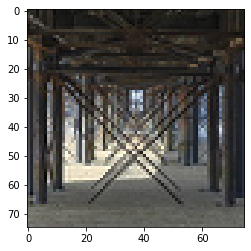

# 11   -   x_test[82]  Prediction:  6 - street    Actual:  1 - buildings


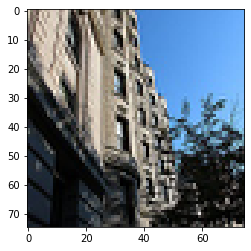

# 12   -   x_test[97]  Prediction:  6 - street    Actual:  1 - buildings


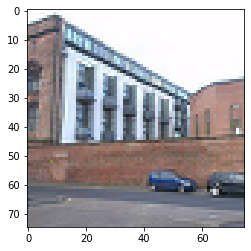

# 13   -   x_test[107]  Prediction:  6 - street    Actual:  1 - buildings


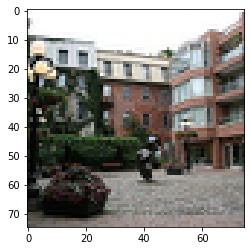

# 14   -   x_test[128]  Prediction:  6 - street    Actual:  1 - buildings


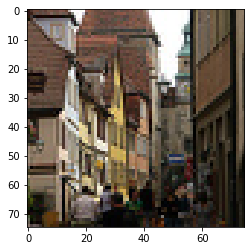

# 15   -   x_test[136]  Prediction:  6 - street    Actual:  1 - buildings


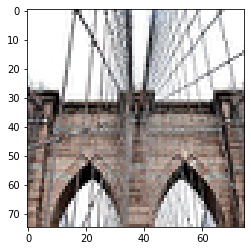

# 16   -   x_test[138]  Prediction:  6 - street    Actual:  1 - buildings


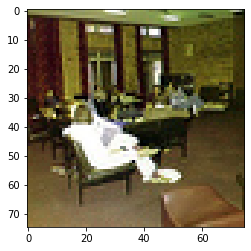

# 17   -   x_test[139]  Prediction:  6 - street    Actual:  1 - buildings


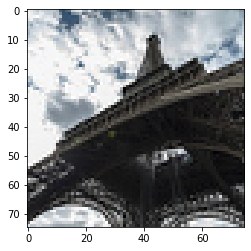

# 18   -   x_test[145]  Prediction:  4 - mountain    Actual:  1 - buildings


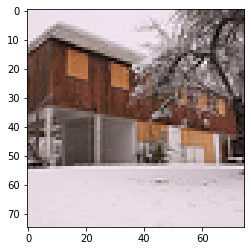

# 19   -   x_test[151]  Prediction:  6 - street    Actual:  1 - buildings


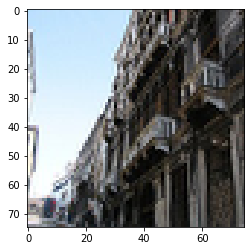

# 20   -   x_test[161]  Prediction:  6 - street    Actual:  1 - buildings


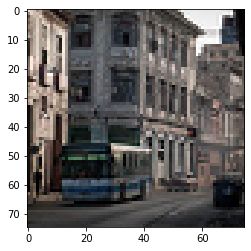

# 21   -   x_test[162]  Prediction:  6 - street    Actual:  1 - buildings


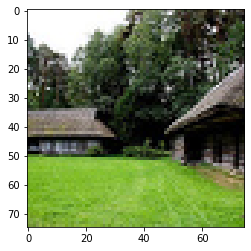

# 22   -   x_test[185]  Prediction:  2 - forest    Actual:  1 - buildings


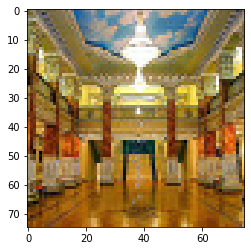

# 23   -   x_test[188]  Prediction:  6 - street    Actual:  1 - buildings


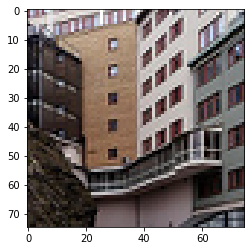

# 24   -   x_test[211]  Prediction:  6 - street    Actual:  1 - buildings


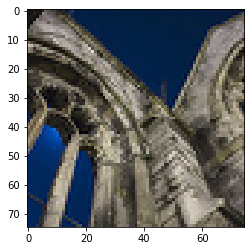

# 25   -   x_test[213]  Prediction:  3 - glacier    Actual:  1 - buildings


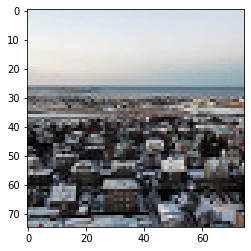

# 26   -   x_test[219]  Prediction:  5 - sea    Actual:  1 - buildings


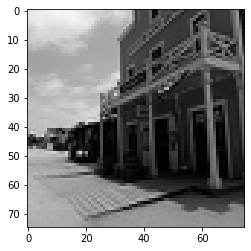

# 27   -   x_test[226]  Prediction:  6 - street    Actual:  1 - buildings


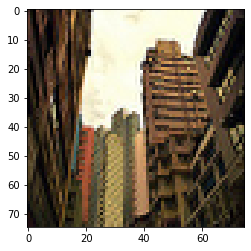

# 28   -   x_test[238]  Prediction:  6 - street    Actual:  1 - buildings


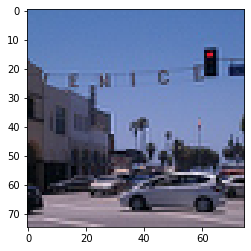

# 29   -   x_test[242]  Prediction:  6 - street    Actual:  1 - buildings


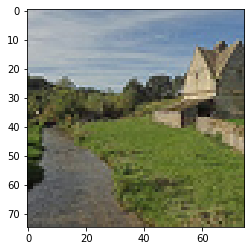

# 30   -   x_test[254]  Prediction:  6 - street    Actual:  1 - buildings


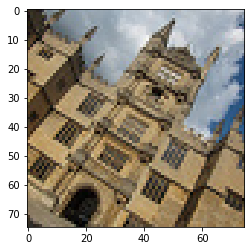

# 31   -   x_test[258]  Prediction:  4 - mountain    Actual:  1 - buildings


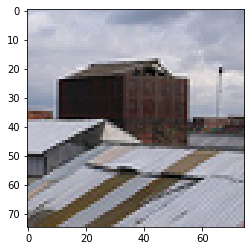

# 32   -   x_test[264]  Prediction:  6 - street    Actual:  1 - buildings


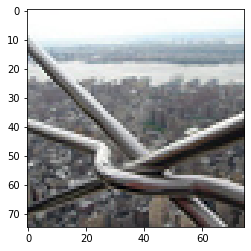

# 33   -   x_test[272]  Prediction:  3 - glacier    Actual:  1 - buildings


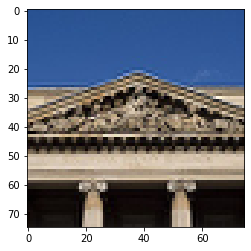

# 34   -   x_test[290]  Prediction:  5 - sea    Actual:  1 - buildings


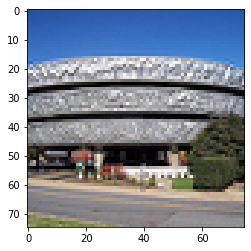

# 35   -   x_test[291]  Prediction:  5 - sea    Actual:  1 - buildings


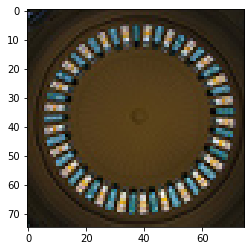

# 36   -   x_test[292]  Prediction:  6 - street    Actual:  1 - buildings


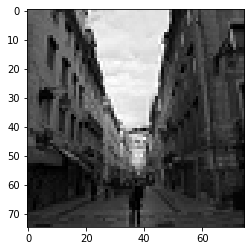

# 37   -   x_test[293]  Prediction:  6 - street    Actual:  1 - buildings


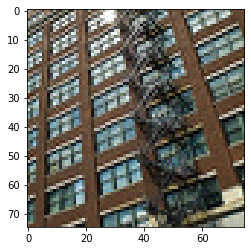

# 38   -   x_test[345]  Prediction:  2 - forest    Actual:  1 - buildings


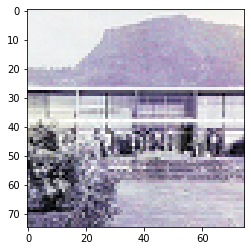

# 39   -   x_test[348]  Prediction:  5 - sea    Actual:  1 - buildings


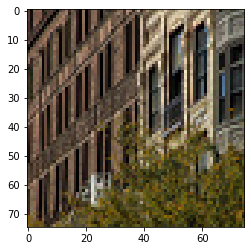

# 40   -   x_test[355]  Prediction:  2 - forest    Actual:  1 - buildings


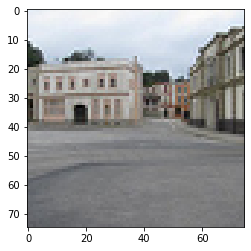

# 41   -   x_test[360]  Prediction:  6 - street    Actual:  1 - buildings


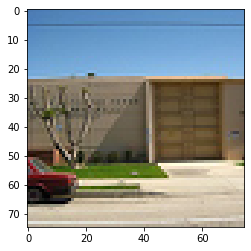

# 42   -   x_test[364]  Prediction:  6 - street    Actual:  1 - buildings


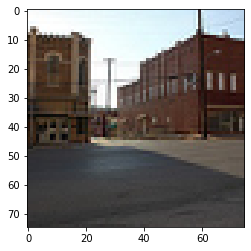

# 43   -   x_test[366]  Prediction:  6 - street    Actual:  1 - buildings


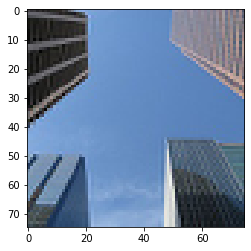

# 44   -   x_test[379]  Prediction:  6 - street    Actual:  1 - buildings


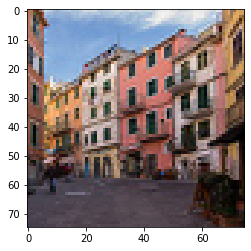

# 45   -   x_test[381]  Prediction:  6 - street    Actual:  1 - buildings


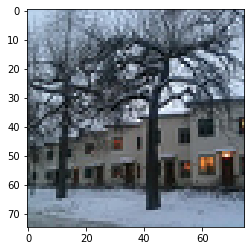

# 46   -   x_test[390]  Prediction:  6 - street    Actual:  1 - buildings


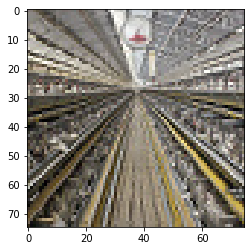

# 47   -   x_test[398]  Prediction:  6 - street    Actual:  1 - buildings


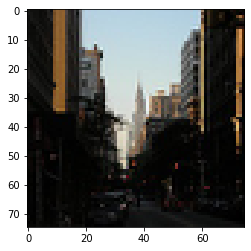

# 48   -   x_test[416]  Prediction:  6 - street    Actual:  1 - buildings


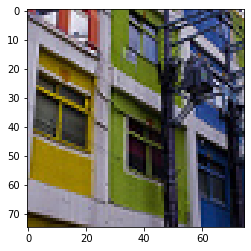

# 49   -   x_test[426]  Prediction:  6 - street    Actual:  1 - buildings


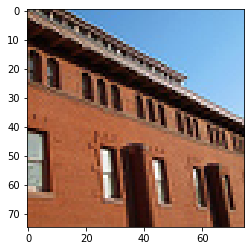

# 50   -   x_test[432]  Prediction:  6 - street    Actual:  1 - buildings


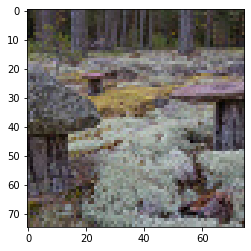

# 51   -   x_test[495]  Prediction:  6 - street    Actual:  2 - forest


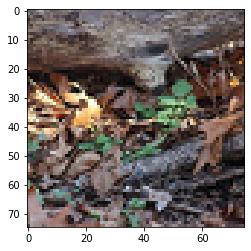

# 52   -   x_test[512]  Prediction:  6 - street    Actual:  2 - forest


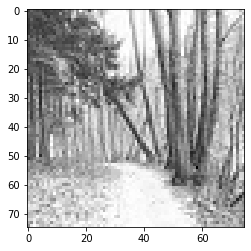

# 53   -   x_test[547]  Prediction:  6 - street    Actual:  2 - forest


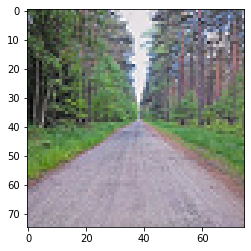

# 54   -   x_test[614]  Prediction:  6 - street    Actual:  2 - forest


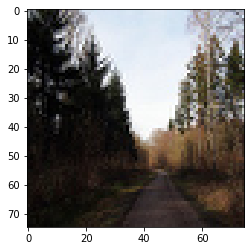

# 55   -   x_test[635]  Prediction:  6 - street    Actual:  2 - forest


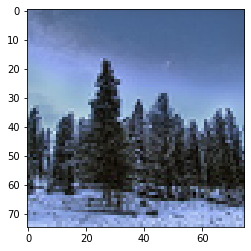

# 56   -   x_test[663]  Prediction:  1 - buildings    Actual:  2 - forest


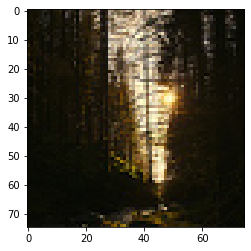

# 57   -   x_test[693]  Prediction:  6 - street    Actual:  2 - forest


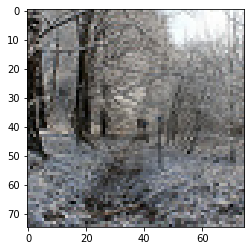

# 58   -   x_test[695]  Prediction:  6 - street    Actual:  2 - forest


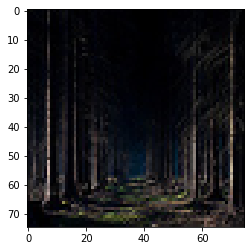

# 59   -   x_test[704]  Prediction:  1 - buildings    Actual:  2 - forest


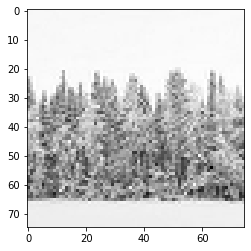

# 60   -   x_test[711]  Prediction:  1 - buildings    Actual:  2 - forest


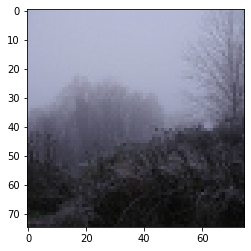

# 61   -   x_test[717]  Prediction:  4 - mountain    Actual:  2 - forest


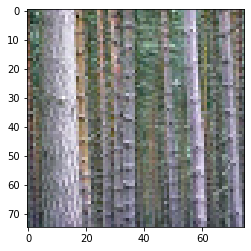

# 62   -   x_test[733]  Prediction:  1 - buildings    Actual:  2 - forest


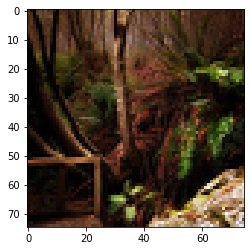

# 63   -   x_test[796]  Prediction:  6 - street    Actual:  2 - forest


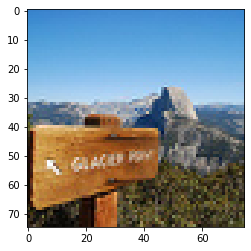

# 64   -   x_test[914]  Prediction:  4 - mountain    Actual:  3 - glacier


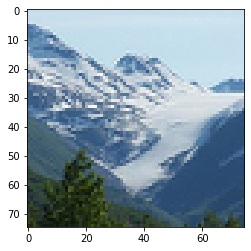

# 65   -   x_test[915]  Prediction:  4 - mountain    Actual:  3 - glacier


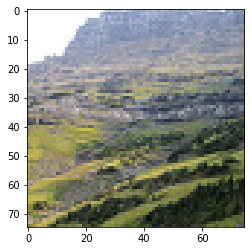

# 66   -   x_test[917]  Prediction:  5 - sea    Actual:  3 - glacier


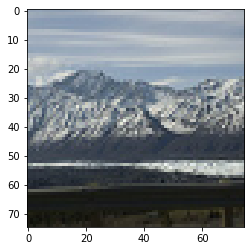

# 67   -   x_test[926]  Prediction:  4 - mountain    Actual:  3 - glacier


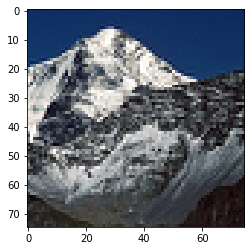

# 68   -   x_test[927]  Prediction:  1 - buildings    Actual:  3 - glacier


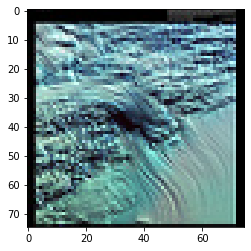

# 69   -   x_test[934]  Prediction:  5 - sea    Actual:  3 - glacier


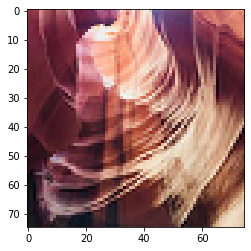

# 70   -   x_test[935]  Prediction:  6 - street    Actual:  3 - glacier


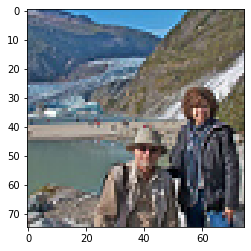

# 71   -   x_test[940]  Prediction:  5 - sea    Actual:  3 - glacier


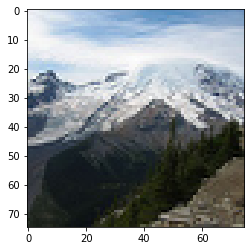

# 72   -   x_test[943]  Prediction:  4 - mountain    Actual:  3 - glacier


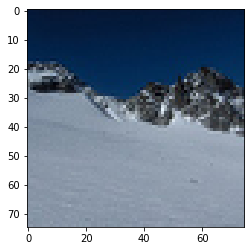

# 73   -   x_test[966]  Prediction:  4 - mountain    Actual:  3 - glacier


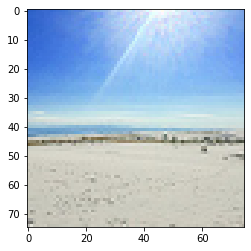

# 74   -   x_test[977]  Prediction:  5 - sea    Actual:  3 - glacier


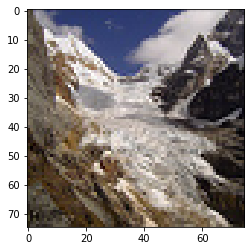

# 75   -   x_test[978]  Prediction:  6 - street    Actual:  3 - glacier


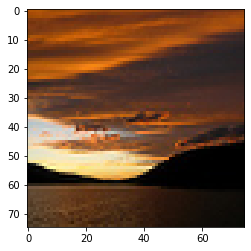

# 76   -   x_test[981]  Prediction:  4 - mountain    Actual:  3 - glacier


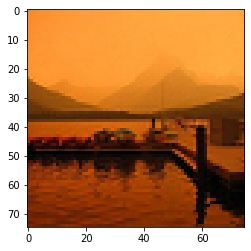

# 77   -   x_test[982]  Prediction:  5 - sea    Actual:  3 - glacier


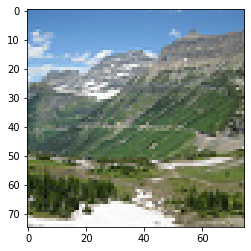

# 78   -   x_test[988]  Prediction:  4 - mountain    Actual:  3 - glacier


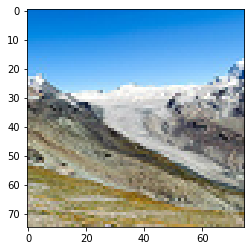

# 79   -   x_test[989]  Prediction:  4 - mountain    Actual:  3 - glacier


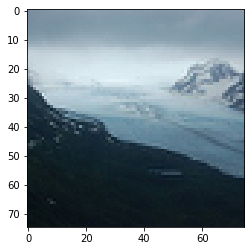

# 80   -   x_test[993]  Prediction:  4 - mountain    Actual:  3 - glacier


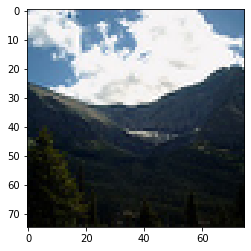

# 81   -   x_test[1000]  Prediction:  4 - mountain    Actual:  3 - glacier


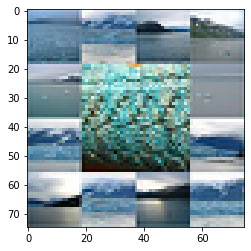

# 82   -   x_test[1020]  Prediction:  5 - sea    Actual:  3 - glacier


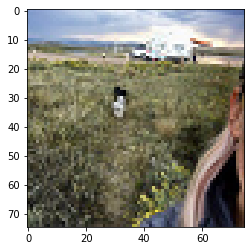

# 83   -   x_test[1023]  Prediction:  5 - sea    Actual:  3 - glacier


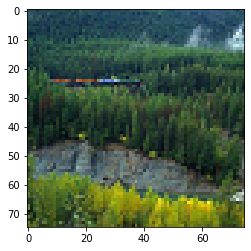

# 84   -   x_test[1026]  Prediction:  5 - sea    Actual:  3 - glacier


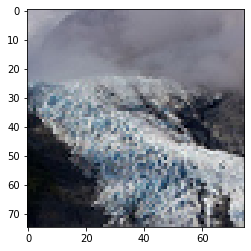

# 85   -   x_test[1031]  Prediction:  4 - mountain    Actual:  3 - glacier


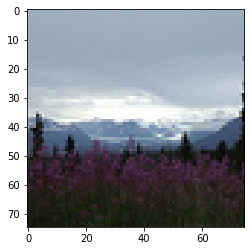

# 86   -   x_test[1032]  Prediction:  4 - mountain    Actual:  3 - glacier


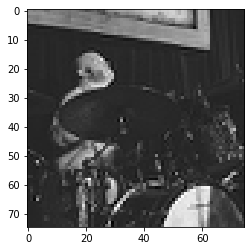

# 87   -   x_test[1039]  Prediction:  6 - street    Actual:  3 - glacier


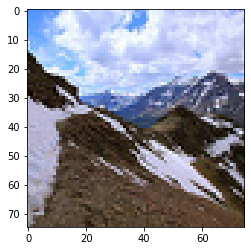

# 88   -   x_test[1042]  Prediction:  4 - mountain    Actual:  3 - glacier


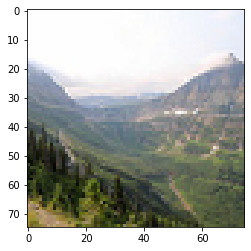

# 89   -   x_test[1050]  Prediction:  4 - mountain    Actual:  3 - glacier


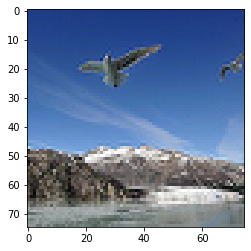

# 90   -   x_test[1058]  Prediction:  4 - mountain    Actual:  3 - glacier


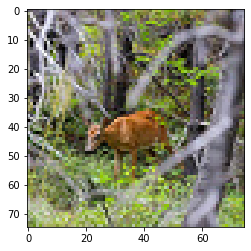

# 91   -   x_test[1063]  Prediction:  2 - forest    Actual:  3 - glacier


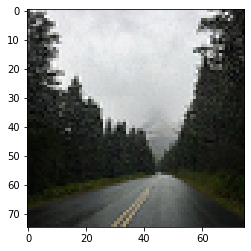

# 92   -   x_test[1067]  Prediction:  6 - street    Actual:  3 - glacier


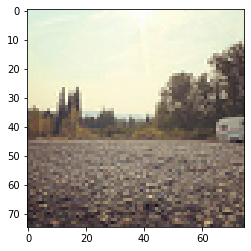

# 93   -   x_test[1078]  Prediction:  2 - forest    Actual:  3 - glacier


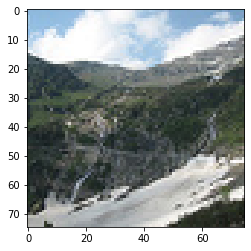

# 94   -   x_test[1081]  Prediction:  4 - mountain    Actual:  3 - glacier


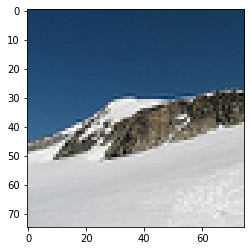

# 95   -   x_test[1083]  Prediction:  4 - mountain    Actual:  3 - glacier


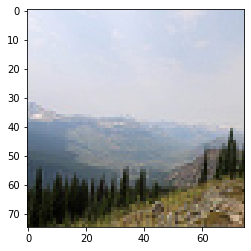

# 96   -   x_test[1086]  Prediction:  4 - mountain    Actual:  3 - glacier


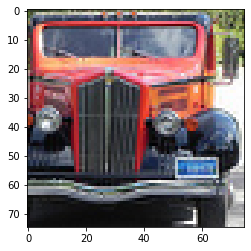

# 97   -   x_test[1095]  Prediction:  1 - buildings    Actual:  3 - glacier


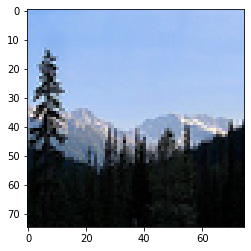

# 98   -   x_test[1096]  Prediction:  4 - mountain    Actual:  3 - glacier


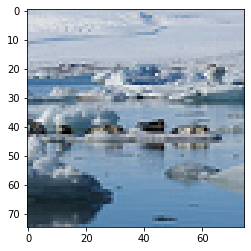

# 99   -   x_test[1104]  Prediction:  5 - sea    Actual:  3 - glacier


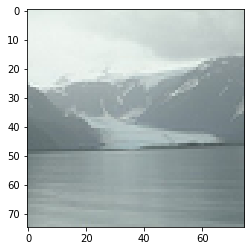

# 100   -   x_test[1105]  Prediction:  5 - sea    Actual:  3 - glacier


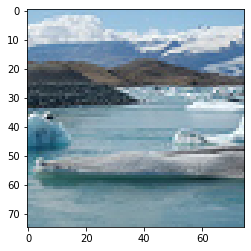

# 101   -   x_test[1115]  Prediction:  5 - sea    Actual:  3 - glacier


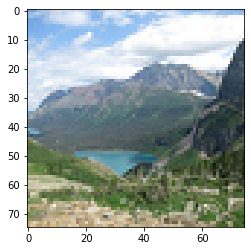

# 102   -   x_test[1117]  Prediction:  4 - mountain    Actual:  3 - glacier


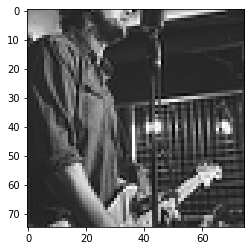

# 103   -   x_test[1128]  Prediction:  1 - buildings    Actual:  3 - glacier


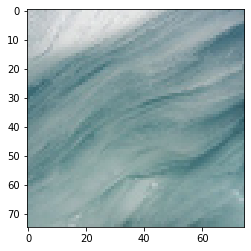

# 104   -   x_test[1131]  Prediction:  5 - sea    Actual:  3 - glacier


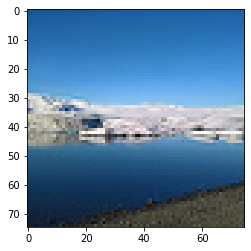

# 105   -   x_test[1152]  Prediction:  5 - sea    Actual:  3 - glacier


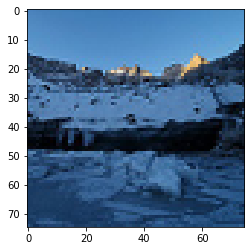

# 106   -   x_test[1155]  Prediction:  5 - sea    Actual:  3 - glacier


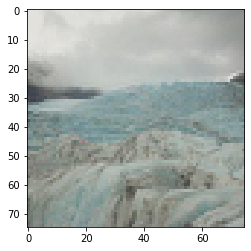

# 107   -   x_test[1156]  Prediction:  5 - sea    Actual:  3 - glacier


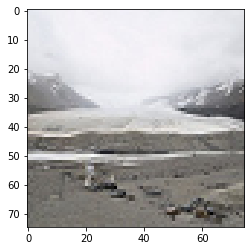

# 108   -   x_test[1159]  Prediction:  5 - sea    Actual:  3 - glacier


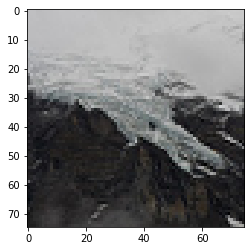

# 109   -   x_test[1162]  Prediction:  4 - mountain    Actual:  3 - glacier


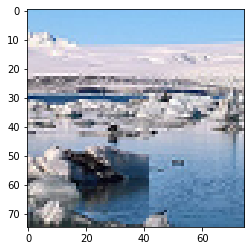

# 110   -   x_test[1186]  Prediction:  5 - sea    Actual:  3 - glacier


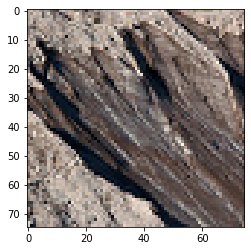

# 111   -   x_test[1188]  Prediction:  4 - mountain    Actual:  3 - glacier


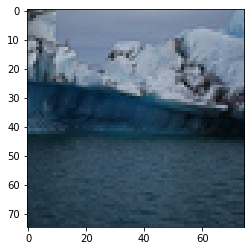

# 112   -   x_test[1201]  Prediction:  5 - sea    Actual:  3 - glacier


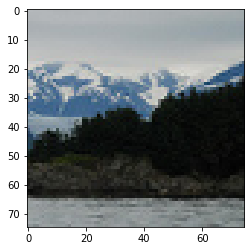

# 113   -   x_test[1203]  Prediction:  4 - mountain    Actual:  3 - glacier


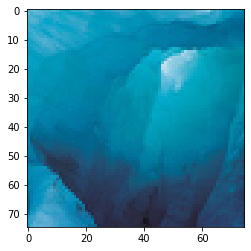

# 114   -   x_test[1209]  Prediction:  5 - sea    Actual:  3 - glacier


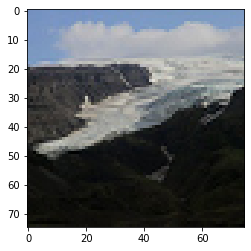

# 115   -   x_test[1214]  Prediction:  5 - sea    Actual:  3 - glacier


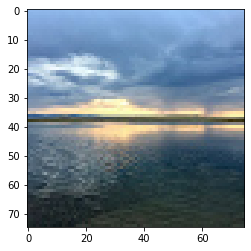

# 116   -   x_test[1215]  Prediction:  5 - sea    Actual:  3 - glacier


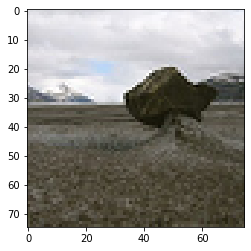

# 117   -   x_test[1217]  Prediction:  5 - sea    Actual:  3 - glacier


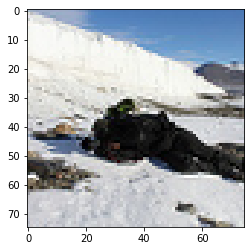

# 118   -   x_test[1219]  Prediction:  4 - mountain    Actual:  3 - glacier


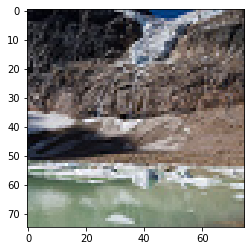

# 119   -   x_test[1225]  Prediction:  6 - street    Actual:  3 - glacier


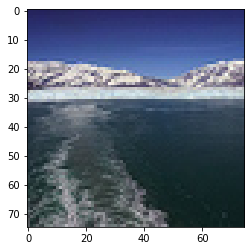

# 120   -   x_test[1235]  Prediction:  5 - sea    Actual:  3 - glacier


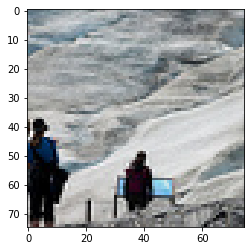

# 121   -   x_test[1239]  Prediction:  5 - sea    Actual:  3 - glacier


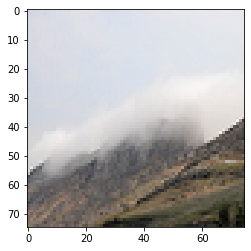

# 122   -   x_test[1240]  Prediction:  4 - mountain    Actual:  3 - glacier


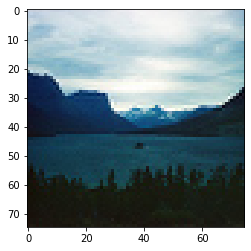

# 123   -   x_test[1243]  Prediction:  4 - mountain    Actual:  3 - glacier


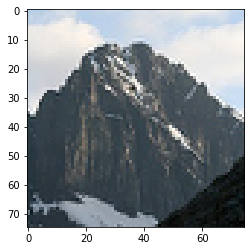

# 124   -   x_test[1249]  Prediction:  4 - mountain    Actual:  3 - glacier


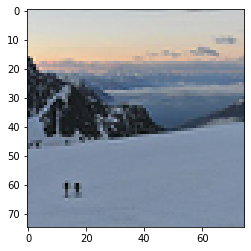

# 125   -   x_test[1254]  Prediction:  4 - mountain    Actual:  3 - glacier


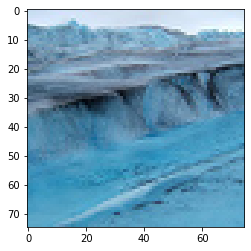

# 126   -   x_test[1257]  Prediction:  5 - sea    Actual:  3 - glacier


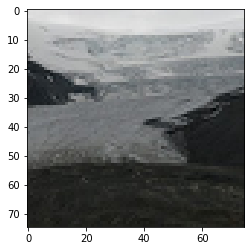

# 127   -   x_test[1262]  Prediction:  5 - sea    Actual:  3 - glacier


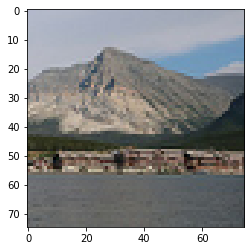

# 128   -   x_test[1265]  Prediction:  4 - mountain    Actual:  3 - glacier


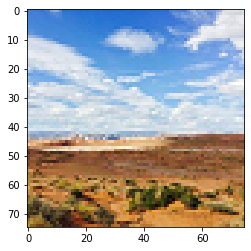

# 129   -   x_test[1283]  Prediction:  5 - sea    Actual:  3 - glacier


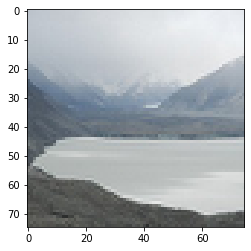

# 130   -   x_test[1284]  Prediction:  4 - mountain    Actual:  3 - glacier


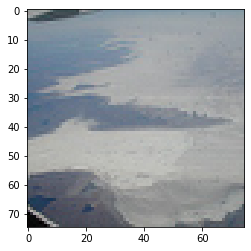

# 131   -   x_test[1289]  Prediction:  4 - mountain    Actual:  3 - glacier


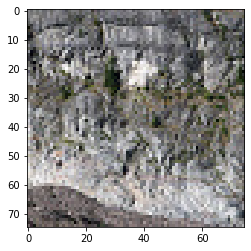

# 132   -   x_test[1297]  Prediction:  2 - forest    Actual:  3 - glacier


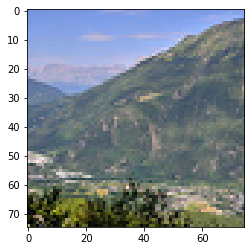

# 133   -   x_test[1303]  Prediction:  4 - mountain    Actual:  3 - glacier


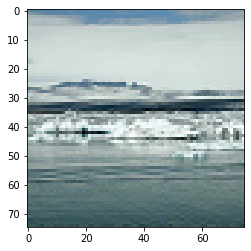

# 134   -   x_test[1305]  Prediction:  5 - sea    Actual:  3 - glacier


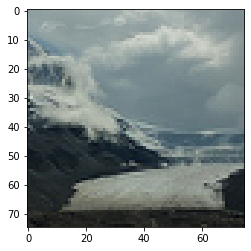

# 135   -   x_test[1312]  Prediction:  5 - sea    Actual:  3 - glacier


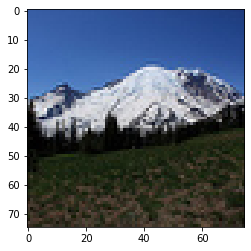

# 136   -   x_test[1314]  Prediction:  4 - mountain    Actual:  3 - glacier


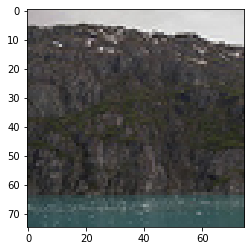

# 137   -   x_test[1318]  Prediction:  2 - forest    Actual:  3 - glacier


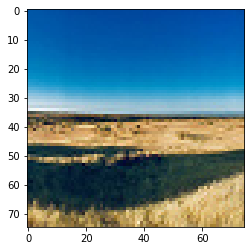

# 138   -   x_test[1322]  Prediction:  5 - sea    Actual:  3 - glacier


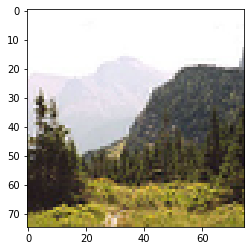

# 139   -   x_test[1332]  Prediction:  4 - mountain    Actual:  3 - glacier


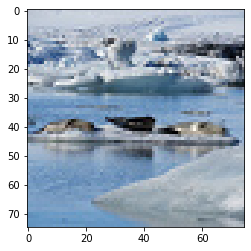

# 140   -   x_test[1335]  Prediction:  5 - sea    Actual:  3 - glacier


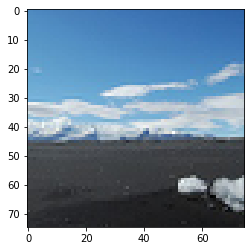

# 141   -   x_test[1342]  Prediction:  4 - mountain    Actual:  3 - glacier


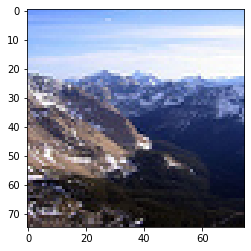

# 142   -   x_test[1354]  Prediction:  4 - mountain    Actual:  3 - glacier


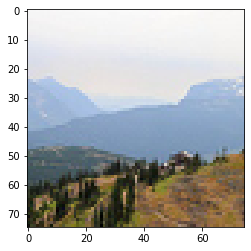

# 143   -   x_test[1362]  Prediction:  4 - mountain    Actual:  3 - glacier


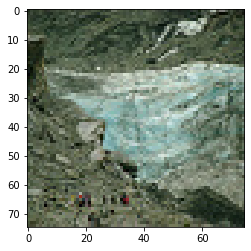

# 144   -   x_test[1370]  Prediction:  5 - sea    Actual:  3 - glacier


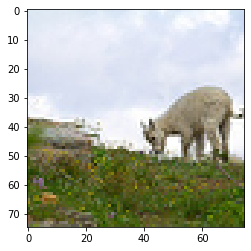

# 145   -   x_test[1372]  Prediction:  5 - sea    Actual:  3 - glacier


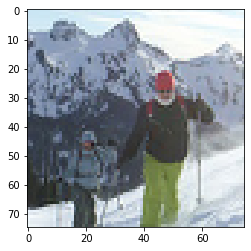

# 146   -   x_test[1397]  Prediction:  4 - mountain    Actual:  3 - glacier


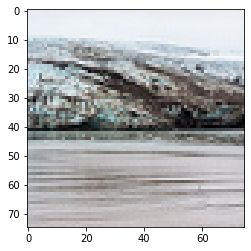

# 147   -   x_test[1406]  Prediction:  5 - sea    Actual:  3 - glacier


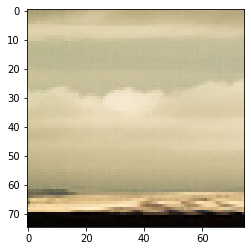

# 148   -   x_test[1417]  Prediction:  5 - sea    Actual:  3 - glacier


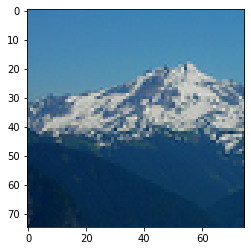

# 149   -   x_test[1418]  Prediction:  4 - mountain    Actual:  3 - glacier


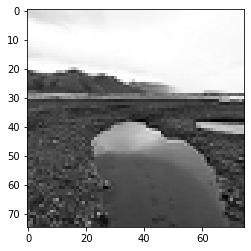

# 150   -   x_test[1436]  Prediction:  5 - sea    Actual:  3 - glacier


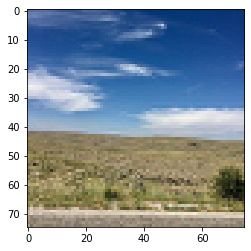

# 151   -   x_test[1451]  Prediction:  4 - mountain    Actual:  3 - glacier


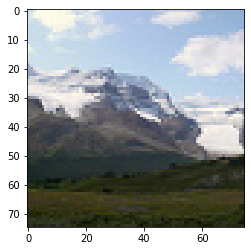

# 152   -   x_test[1453]  Prediction:  4 - mountain    Actual:  3 - glacier


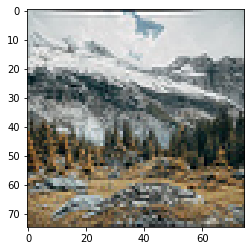

# 153   -   x_test[1460]  Prediction:  3 - glacier    Actual:  4 - mountain


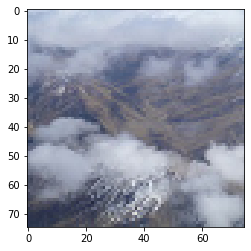

# 154   -   x_test[1464]  Prediction:  3 - glacier    Actual:  4 - mountain


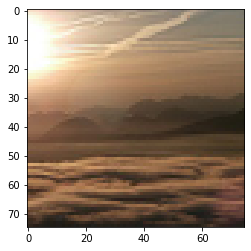

# 155   -   x_test[1469]  Prediction:  5 - sea    Actual:  4 - mountain


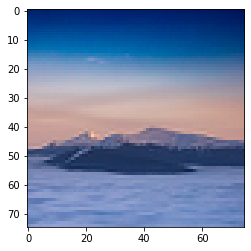

# 156   -   x_test[1472]  Prediction:  3 - glacier    Actual:  4 - mountain


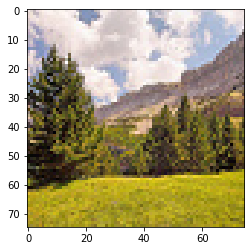

# 157   -   x_test[1485]  Prediction:  2 - forest    Actual:  4 - mountain


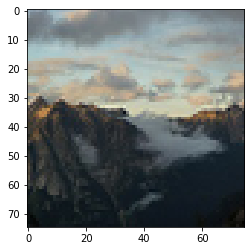

# 158   -   x_test[1488]  Prediction:  5 - sea    Actual:  4 - mountain


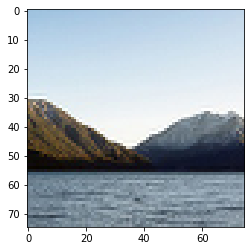

# 159   -   x_test[1492]  Prediction:  3 - glacier    Actual:  4 - mountain


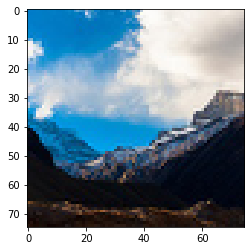

# 160   -   x_test[1499]  Prediction:  3 - glacier    Actual:  4 - mountain


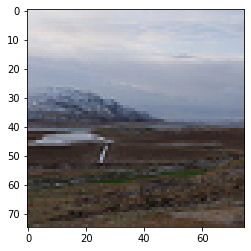

# 161   -   x_test[1502]  Prediction:  5 - sea    Actual:  4 - mountain


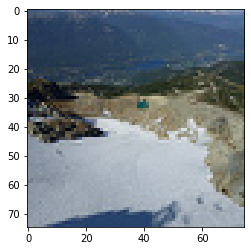

# 162   -   x_test[1506]  Prediction:  5 - sea    Actual:  4 - mountain


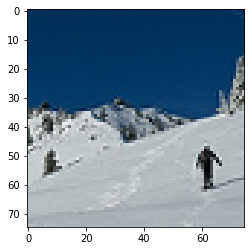

# 163   -   x_test[1508]  Prediction:  3 - glacier    Actual:  4 - mountain


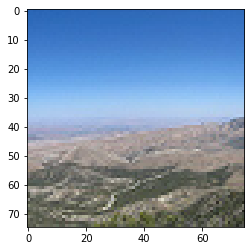

# 164   -   x_test[1518]  Prediction:  5 - sea    Actual:  4 - mountain


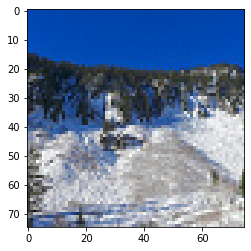

# 165   -   x_test[1528]  Prediction:  5 - sea    Actual:  4 - mountain


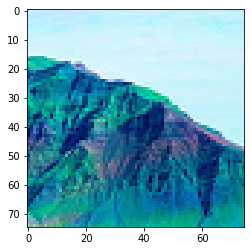

# 166   -   x_test[1529]  Prediction:  5 - sea    Actual:  4 - mountain


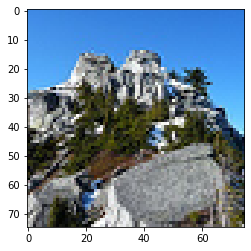

# 167   -   x_test[1530]  Prediction:  1 - buildings    Actual:  4 - mountain


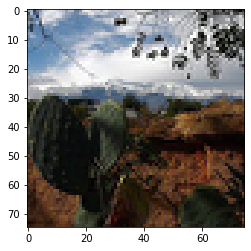

# 168   -   x_test[1532]  Prediction:  2 - forest    Actual:  4 - mountain


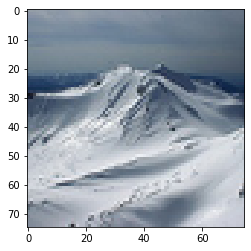

# 169   -   x_test[1534]  Prediction:  3 - glacier    Actual:  4 - mountain


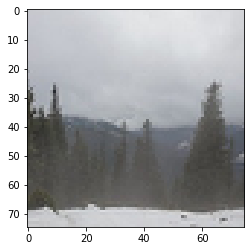

# 170   -   x_test[1539]  Prediction:  3 - glacier    Actual:  4 - mountain


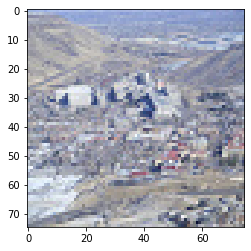

# 171   -   x_test[1540]  Prediction:  5 - sea    Actual:  4 - mountain


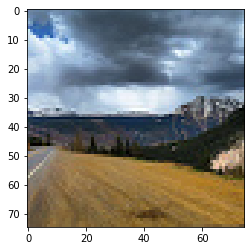

# 172   -   x_test[1542]  Prediction:  5 - sea    Actual:  4 - mountain


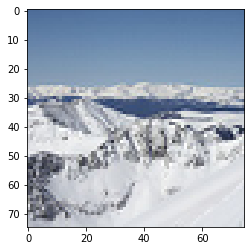

# 173   -   x_test[1545]  Prediction:  3 - glacier    Actual:  4 - mountain


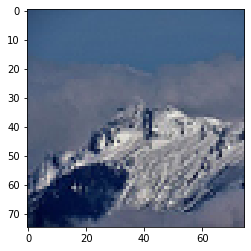

# 174   -   x_test[1549]  Prediction:  3 - glacier    Actual:  4 - mountain


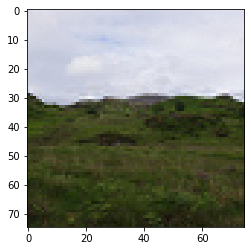

# 175   -   x_test[1556]  Prediction:  2 - forest    Actual:  4 - mountain


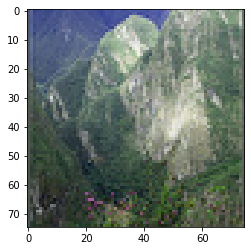

# 176   -   x_test[1561]  Prediction:  2 - forest    Actual:  4 - mountain


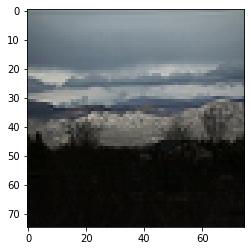

# 177   -   x_test[1564]  Prediction:  5 - sea    Actual:  4 - mountain


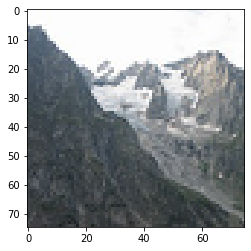

# 178   -   x_test[1566]  Prediction:  3 - glacier    Actual:  4 - mountain


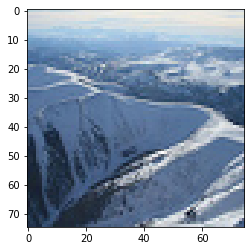

# 179   -   x_test[1568]  Prediction:  3 - glacier    Actual:  4 - mountain


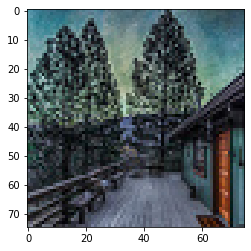

# 180   -   x_test[1572]  Prediction:  6 - street    Actual:  4 - mountain


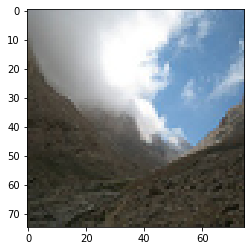

# 181   -   x_test[1584]  Prediction:  3 - glacier    Actual:  4 - mountain


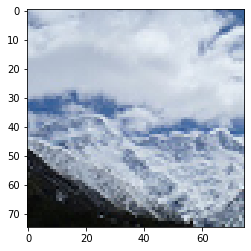

# 182   -   x_test[1591]  Prediction:  3 - glacier    Actual:  4 - mountain


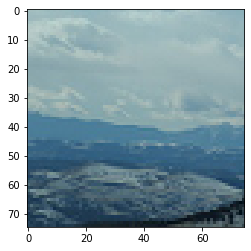

# 183   -   x_test[1594]  Prediction:  5 - sea    Actual:  4 - mountain


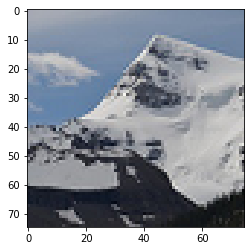

# 184   -   x_test[1597]  Prediction:  3 - glacier    Actual:  4 - mountain


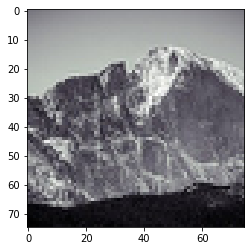

# 185   -   x_test[1608]  Prediction:  3 - glacier    Actual:  4 - mountain


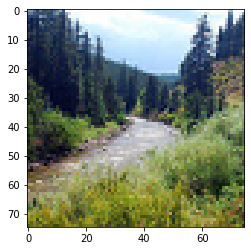

# 186   -   x_test[1611]  Prediction:  6 - street    Actual:  4 - mountain


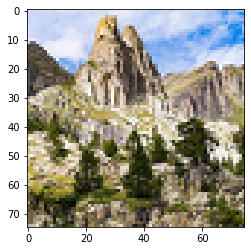

# 187   -   x_test[1613]  Prediction:  1 - buildings    Actual:  4 - mountain


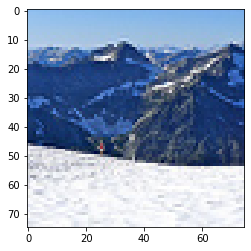

# 188   -   x_test[1614]  Prediction:  3 - glacier    Actual:  4 - mountain


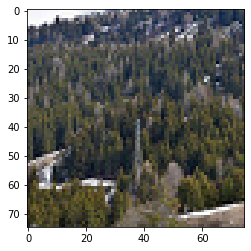

# 189   -   x_test[1617]  Prediction:  2 - forest    Actual:  4 - mountain


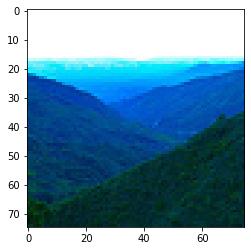

# 190   -   x_test[1618]  Prediction:  5 - sea    Actual:  4 - mountain


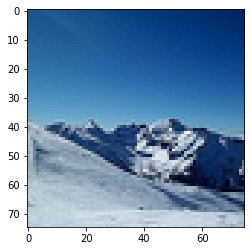

# 191   -   x_test[1621]  Prediction:  3 - glacier    Actual:  4 - mountain


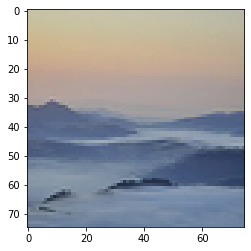

# 192   -   x_test[1624]  Prediction:  5 - sea    Actual:  4 - mountain


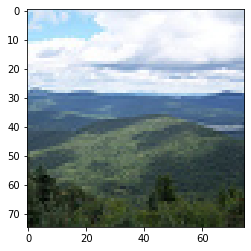

# 193   -   x_test[1629]  Prediction:  5 - sea    Actual:  4 - mountain


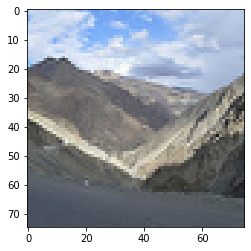

# 194   -   x_test[1635]  Prediction:  3 - glacier    Actual:  4 - mountain


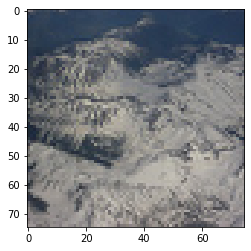

# 195   -   x_test[1636]  Prediction:  3 - glacier    Actual:  4 - mountain


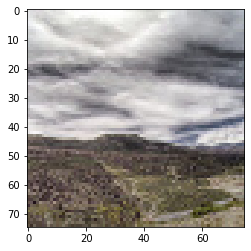

# 196   -   x_test[1637]  Prediction:  5 - sea    Actual:  4 - mountain


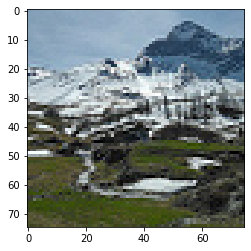

# 197   -   x_test[1645]  Prediction:  3 - glacier    Actual:  4 - mountain


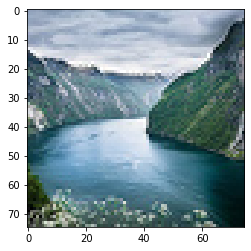

# 198   -   x_test[1647]  Prediction:  3 - glacier    Actual:  4 - mountain


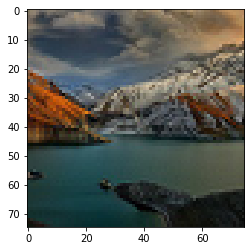

# 199   -   x_test[1655]  Prediction:  5 - sea    Actual:  4 - mountain


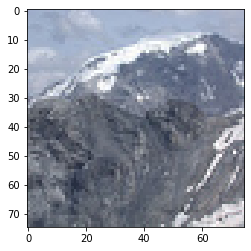

# 200   -   x_test[1659]  Prediction:  3 - glacier    Actual:  4 - mountain


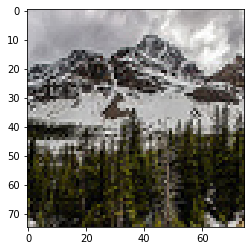

# 201   -   x_test[1665]  Prediction:  1 - buildings    Actual:  4 - mountain


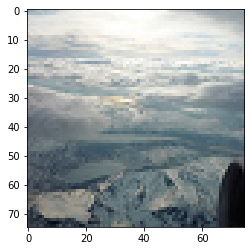

# 202   -   x_test[1674]  Prediction:  5 - sea    Actual:  4 - mountain


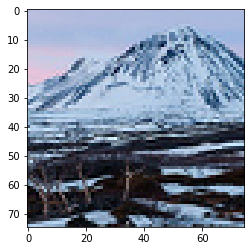

# 203   -   x_test[1682]  Prediction:  3 - glacier    Actual:  4 - mountain


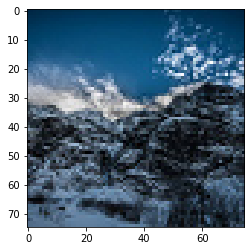

# 204   -   x_test[1683]  Prediction:  3 - glacier    Actual:  4 - mountain


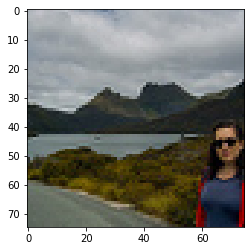

# 205   -   x_test[1685]  Prediction:  3 - glacier    Actual:  4 - mountain


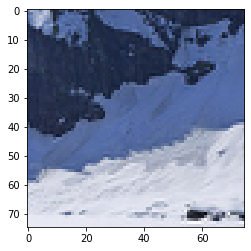

# 206   -   x_test[1695]  Prediction:  3 - glacier    Actual:  4 - mountain


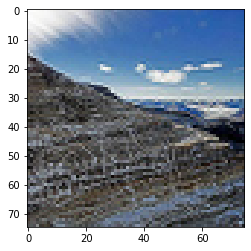

# 207   -   x_test[1697]  Prediction:  1 - buildings    Actual:  4 - mountain


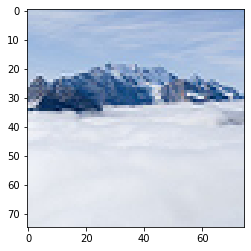

# 208   -   x_test[1710]  Prediction:  3 - glacier    Actual:  4 - mountain


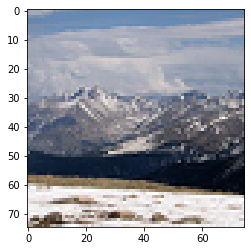

# 209   -   x_test[1711]  Prediction:  3 - glacier    Actual:  4 - mountain


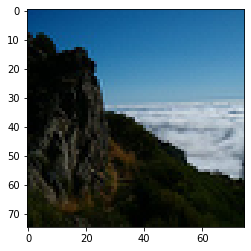

# 210   -   x_test[1716]  Prediction:  5 - sea    Actual:  4 - mountain


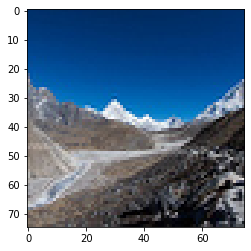

# 211   -   x_test[1729]  Prediction:  3 - glacier    Actual:  4 - mountain


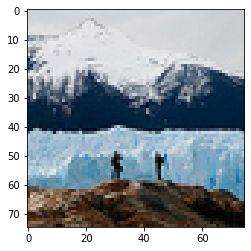

# 212   -   x_test[1730]  Prediction:  3 - glacier    Actual:  4 - mountain


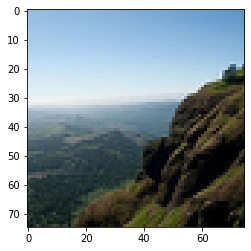

# 213   -   x_test[1734]  Prediction:  5 - sea    Actual:  4 - mountain


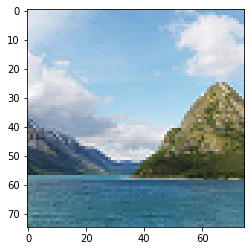

# 214   -   x_test[1736]  Prediction:  5 - sea    Actual:  4 - mountain


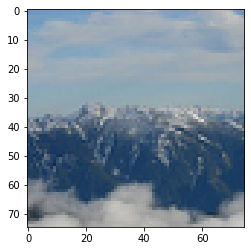

# 215   -   x_test[1740]  Prediction:  3 - glacier    Actual:  4 - mountain


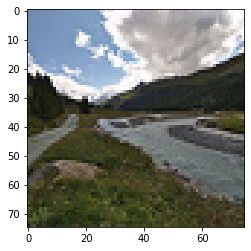

# 216   -   x_test[1743]  Prediction:  3 - glacier    Actual:  4 - mountain


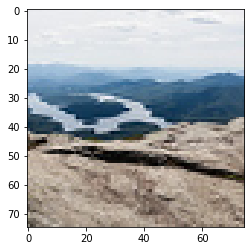

# 217   -   x_test[1744]  Prediction:  5 - sea    Actual:  4 - mountain


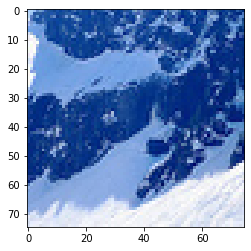

# 218   -   x_test[1745]  Prediction:  3 - glacier    Actual:  4 - mountain


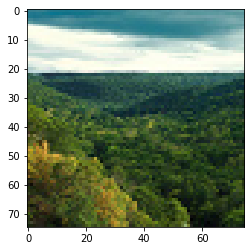

# 219   -   x_test[1746]  Prediction:  5 - sea    Actual:  4 - mountain


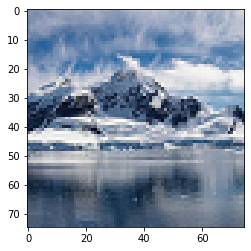

# 220   -   x_test[1753]  Prediction:  3 - glacier    Actual:  4 - mountain


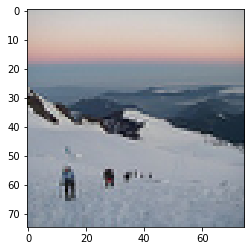

# 221   -   x_test[1765]  Prediction:  3 - glacier    Actual:  4 - mountain


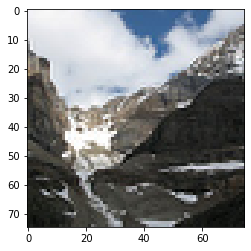

# 222   -   x_test[1767]  Prediction:  3 - glacier    Actual:  4 - mountain


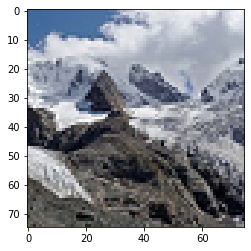

# 223   -   x_test[1774]  Prediction:  3 - glacier    Actual:  4 - mountain


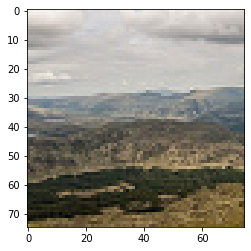

# 224   -   x_test[1778]  Prediction:  5 - sea    Actual:  4 - mountain


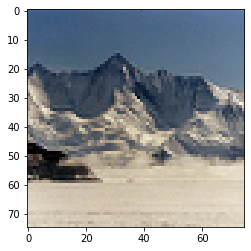

# 225   -   x_test[1779]  Prediction:  3 - glacier    Actual:  4 - mountain


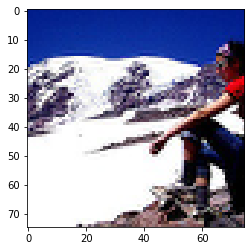

# 226   -   x_test[1781]  Prediction:  3 - glacier    Actual:  4 - mountain


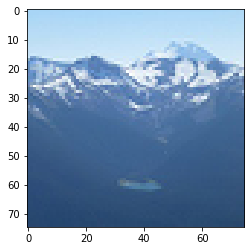

# 227   -   x_test[1782]  Prediction:  3 - glacier    Actual:  4 - mountain


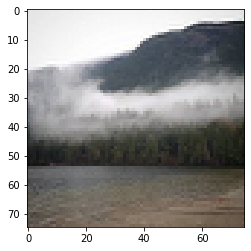

# 228   -   x_test[1785]  Prediction:  3 - glacier    Actual:  4 - mountain


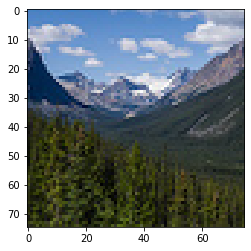

# 229   -   x_test[1789]  Prediction:  3 - glacier    Actual:  4 - mountain


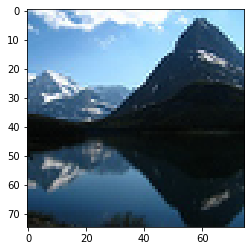

# 230   -   x_test[1790]  Prediction:  3 - glacier    Actual:  4 - mountain


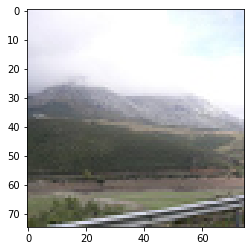

# 231   -   x_test[1792]  Prediction:  5 - sea    Actual:  4 - mountain


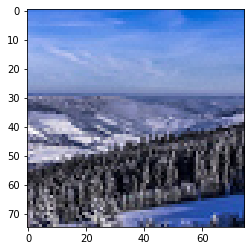

# 232   -   x_test[1798]  Prediction:  5 - sea    Actual:  4 - mountain


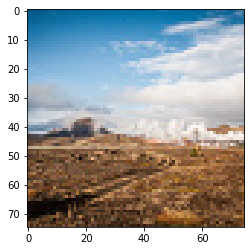

# 233   -   x_test[1804]  Prediction:  5 - sea    Actual:  4 - mountain


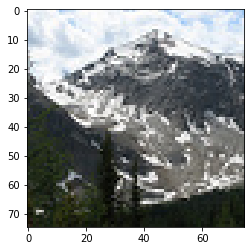

# 234   -   x_test[1808]  Prediction:  3 - glacier    Actual:  4 - mountain


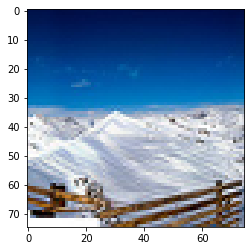

# 235   -   x_test[1809]  Prediction:  3 - glacier    Actual:  4 - mountain


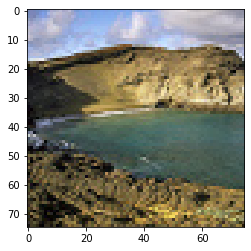

# 236   -   x_test[1813]  Prediction:  5 - sea    Actual:  4 - mountain


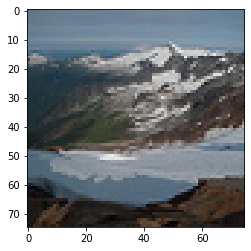

# 237   -   x_test[1820]  Prediction:  3 - glacier    Actual:  4 - mountain


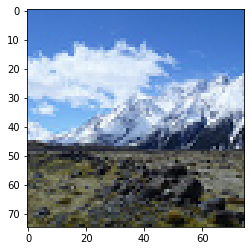

# 238   -   x_test[1823]  Prediction:  3 - glacier    Actual:  4 - mountain


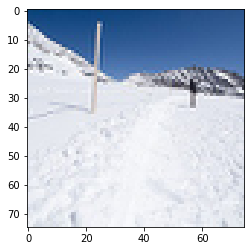

# 239   -   x_test[1831]  Prediction:  3 - glacier    Actual:  4 - mountain


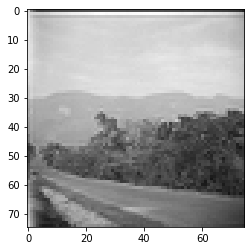

# 240   -   x_test[1835]  Prediction:  3 - glacier    Actual:  4 - mountain


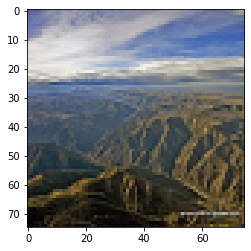

# 241   -   x_test[1836]  Prediction:  5 - sea    Actual:  4 - mountain


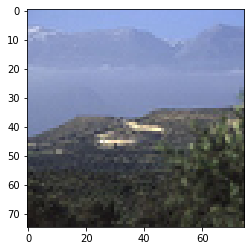

# 242   -   x_test[1837]  Prediction:  5 - sea    Actual:  4 - mountain


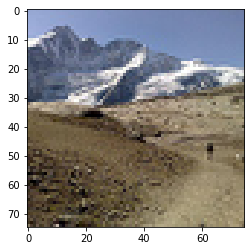

# 243   -   x_test[1841]  Prediction:  3 - glacier    Actual:  4 - mountain


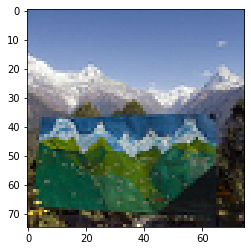

# 244   -   x_test[1842]  Prediction:  3 - glacier    Actual:  4 - mountain


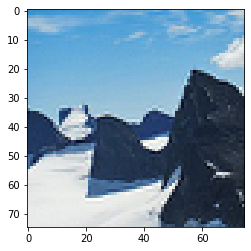

# 245   -   x_test[1843]  Prediction:  3 - glacier    Actual:  4 - mountain


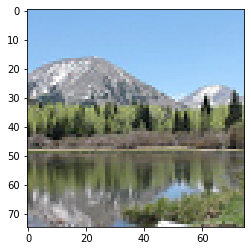

# 246   -   x_test[1844]  Prediction:  1 - buildings    Actual:  4 - mountain


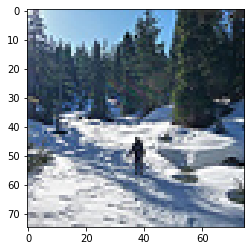

# 247   -   x_test[1853]  Prediction:  3 - glacier    Actual:  4 - mountain


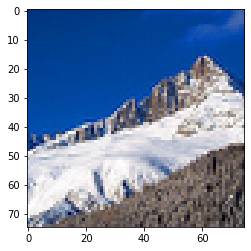

# 248   -   x_test[1855]  Prediction:  3 - glacier    Actual:  4 - mountain


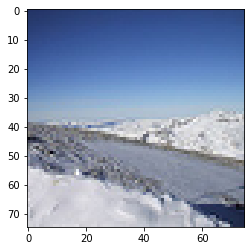

# 249   -   x_test[1862]  Prediction:  3 - glacier    Actual:  4 - mountain


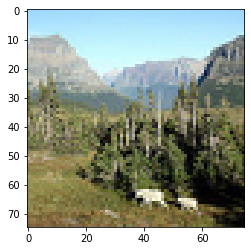

# 250   -   x_test[1869]  Prediction:  2 - forest    Actual:  4 - mountain


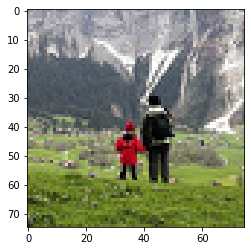

# 251   -   x_test[1871]  Prediction:  2 - forest    Actual:  4 - mountain


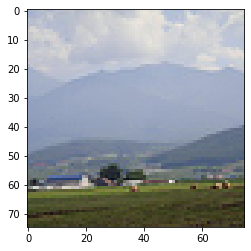

# 252   -   x_test[1874]  Prediction:  5 - sea    Actual:  4 - mountain


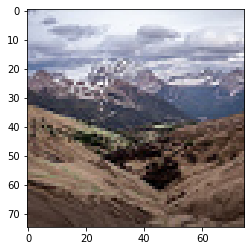

# 253   -   x_test[1883]  Prediction:  5 - sea    Actual:  4 - mountain


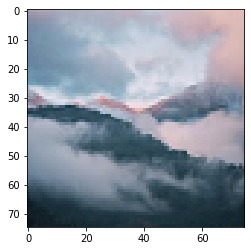

# 254   -   x_test[1888]  Prediction:  3 - glacier    Actual:  4 - mountain


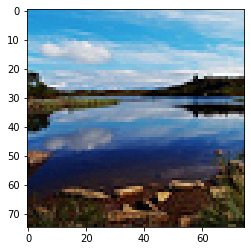

# 255   -   x_test[1889]  Prediction:  5 - sea    Actual:  4 - mountain


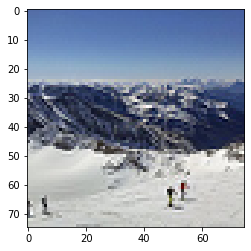

# 256   -   x_test[1890]  Prediction:  3 - glacier    Actual:  4 - mountain


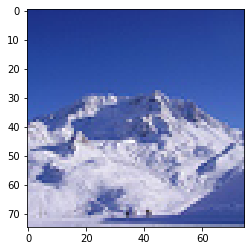

# 257   -   x_test[1891]  Prediction:  3 - glacier    Actual:  4 - mountain


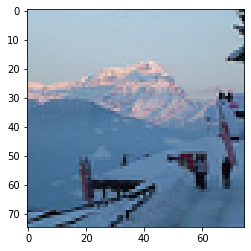

# 258   -   x_test[1899]  Prediction:  3 - glacier    Actual:  4 - mountain


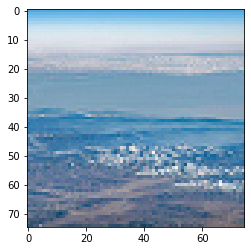

# 259   -   x_test[1903]  Prediction:  5 - sea    Actual:  4 - mountain


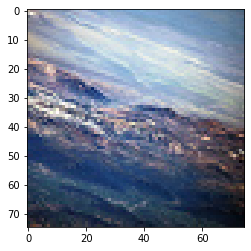

# 260   -   x_test[1908]  Prediction:  3 - glacier    Actual:  4 - mountain


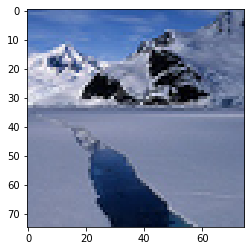

# 261   -   x_test[1910]  Prediction:  3 - glacier    Actual:  4 - mountain


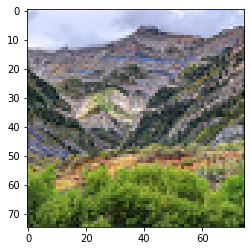

# 262   -   x_test[1916]  Prediction:  3 - glacier    Actual:  4 - mountain


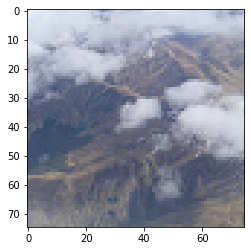

# 263   -   x_test[1918]  Prediction:  3 - glacier    Actual:  4 - mountain


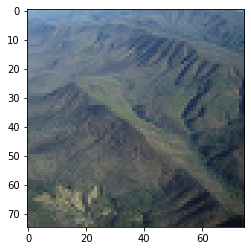

# 264   -   x_test[1920]  Prediction:  3 - glacier    Actual:  4 - mountain


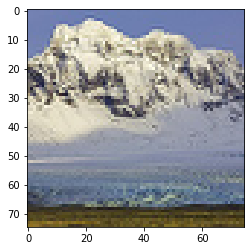

# 265   -   x_test[1922]  Prediction:  3 - glacier    Actual:  4 - mountain


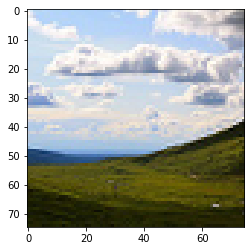

# 266   -   x_test[1924]  Prediction:  3 - glacier    Actual:  4 - mountain


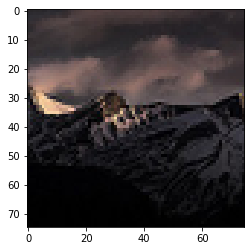

# 267   -   x_test[1932]  Prediction:  5 - sea    Actual:  4 - mountain


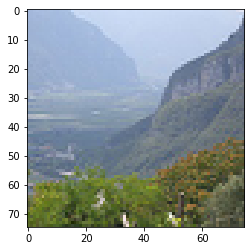

# 268   -   x_test[1937]  Prediction:  3 - glacier    Actual:  4 - mountain


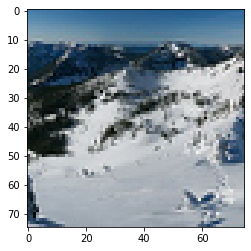

# 269   -   x_test[1938]  Prediction:  3 - glacier    Actual:  4 - mountain


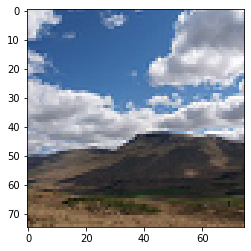

# 270   -   x_test[1940]  Prediction:  3 - glacier    Actual:  4 - mountain


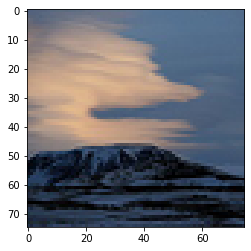

# 271   -   x_test[1954]  Prediction:  5 - sea    Actual:  4 - mountain


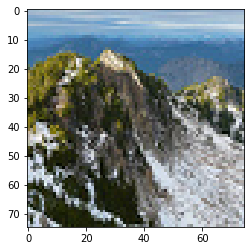

# 272   -   x_test[1955]  Prediction:  5 - sea    Actual:  4 - mountain


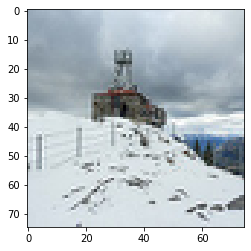

# 273   -   x_test[1956]  Prediction:  3 - glacier    Actual:  4 - mountain


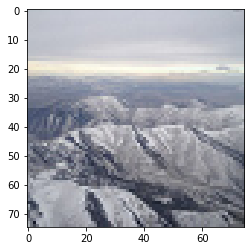

# 274   -   x_test[1960]  Prediction:  3 - glacier    Actual:  4 - mountain


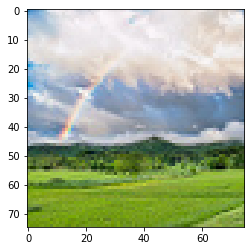

# 275   -   x_test[1961]  Prediction:  3 - glacier    Actual:  4 - mountain


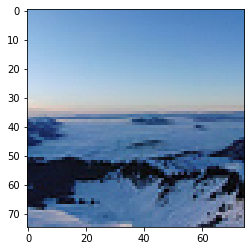

# 276   -   x_test[1962]  Prediction:  5 - sea    Actual:  4 - mountain


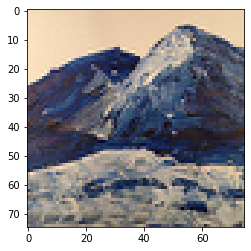

# 277   -   x_test[1963]  Prediction:  3 - glacier    Actual:  4 - mountain


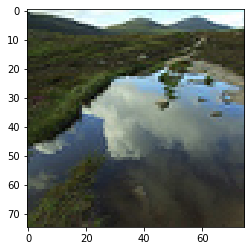

# 278   -   x_test[1965]  Prediction:  3 - glacier    Actual:  4 - mountain


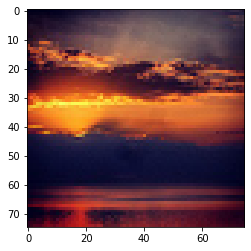

# 279   -   x_test[1991]  Prediction:  4 - mountain    Actual:  5 - sea


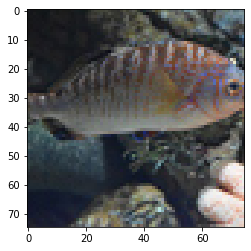

# 280   -   x_test[2012]  Prediction:  6 - street    Actual:  5 - sea


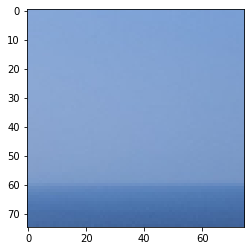

# 281   -   x_test[2014]  Prediction:  4 - mountain    Actual:  5 - sea


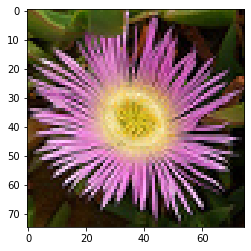

# 282   -   x_test[2058]  Prediction:  2 - forest    Actual:  5 - sea


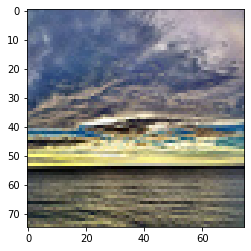

# 283   -   x_test[2083]  Prediction:  4 - mountain    Actual:  5 - sea


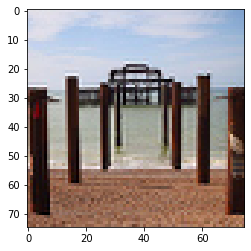

# 284   -   x_test[2096]  Prediction:  1 - buildings    Actual:  5 - sea


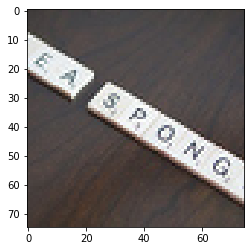

# 285   -   x_test[2107]  Prediction:  3 - glacier    Actual:  5 - sea


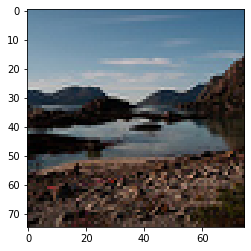

# 286   -   x_test[2116]  Prediction:  4 - mountain    Actual:  5 - sea


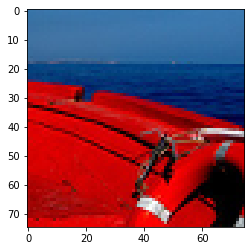

# 287   -   x_test[2134]  Prediction:  1 - buildings    Actual:  5 - sea


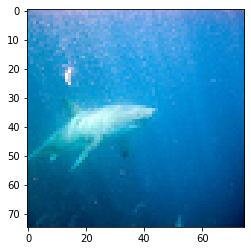

# 288   -   x_test[2152]  Prediction:  4 - mountain    Actual:  5 - sea


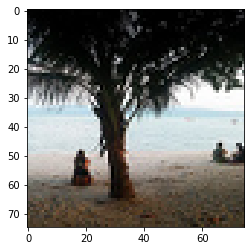

# 289   -   x_test[2154]  Prediction:  6 - street    Actual:  5 - sea


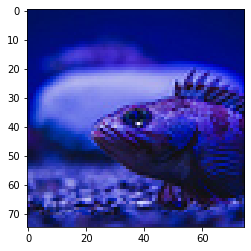

# 290   -   x_test[2162]  Prediction:  4 - mountain    Actual:  5 - sea


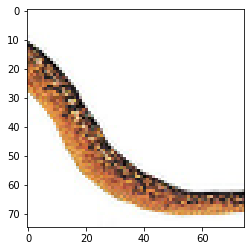

# 291   -   x_test[2171]  Prediction:  3 - glacier    Actual:  5 - sea


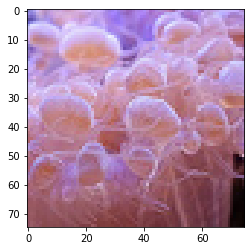

# 292   -   x_test[2188]  Prediction:  1 - buildings    Actual:  5 - sea


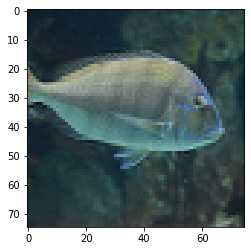

# 293   -   x_test[2189]  Prediction:  3 - glacier    Actual:  5 - sea


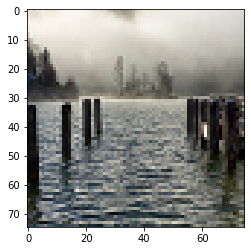

# 294   -   x_test[2210]  Prediction:  1 - buildings    Actual:  5 - sea


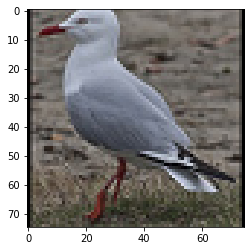

# 295   -   x_test[2216]  Prediction:  6 - street    Actual:  5 - sea


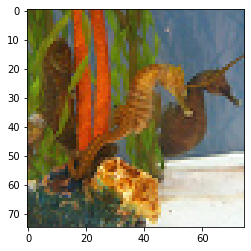

# 296   -   x_test[2219]  Prediction:  2 - forest    Actual:  5 - sea


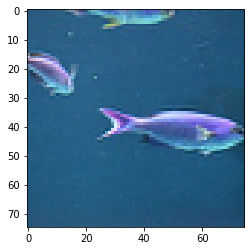

# 297   -   x_test[2259]  Prediction:  3 - glacier    Actual:  5 - sea


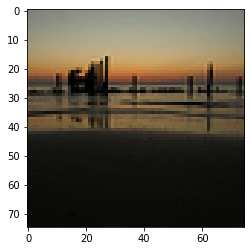

# 298   -   x_test[2318]  Prediction:  6 - street    Actual:  5 - sea


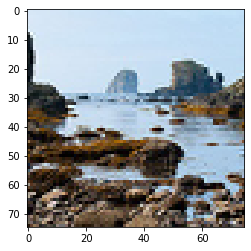

# 299   -   x_test[2327]  Prediction:  1 - buildings    Actual:  5 - sea


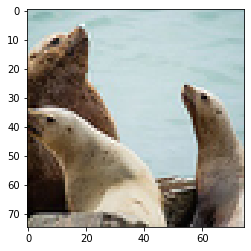

# 300   -   x_test[2331]  Prediction:  1 - buildings    Actual:  5 - sea


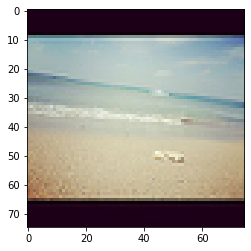

# 301   -   x_test[2335]  Prediction:  4 - mountain    Actual:  5 - sea


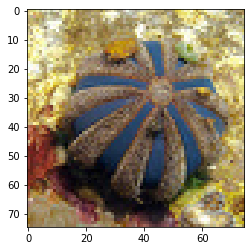

# 302   -   x_test[2387]  Prediction:  2 - forest    Actual:  5 - sea


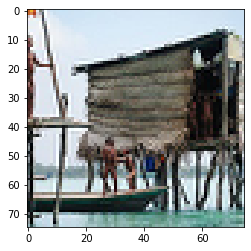

# 303   -   x_test[2397]  Prediction:  6 - street    Actual:  5 - sea


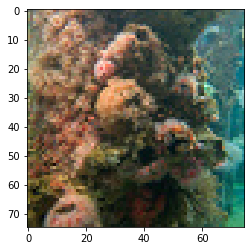

# 304   -   x_test[2400]  Prediction:  2 - forest    Actual:  5 - sea


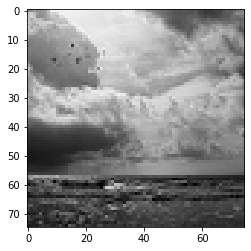

# 305   -   x_test[2403]  Prediction:  3 - glacier    Actual:  5 - sea


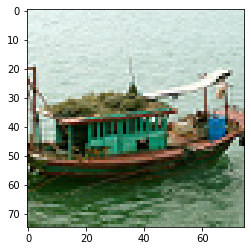

# 306   -   x_test[2409]  Prediction:  1 - buildings    Actual:  5 - sea


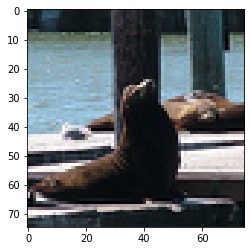

# 307   -   x_test[2412]  Prediction:  6 - street    Actual:  5 - sea


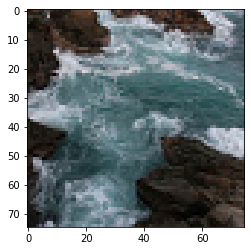

# 308   -   x_test[2422]  Prediction:  3 - glacier    Actual:  5 - sea


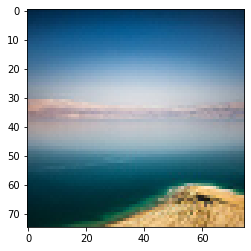

# 309   -   x_test[2423]  Prediction:  4 - mountain    Actual:  5 - sea


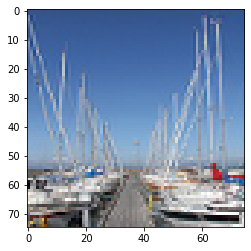

# 310   -   x_test[2431]  Prediction:  1 - buildings    Actual:  5 - sea


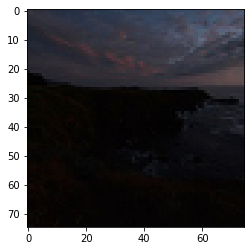

# 311   -   x_test[2441]  Prediction:  4 - mountain    Actual:  5 - sea


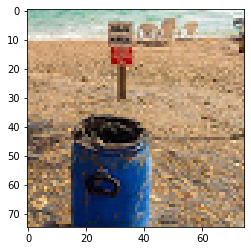

# 312   -   x_test[2460]  Prediction:  1 - buildings    Actual:  5 - sea


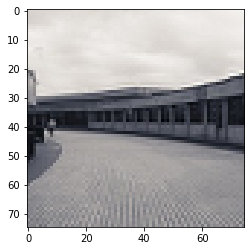

# 313   -   x_test[2492]  Prediction:  1 - buildings    Actual:  6 - street


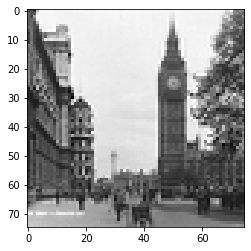

# 314   -   x_test[2505]  Prediction:  1 - buildings    Actual:  6 - street


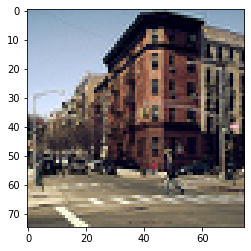

# 315   -   x_test[2518]  Prediction:  1 - buildings    Actual:  6 - street


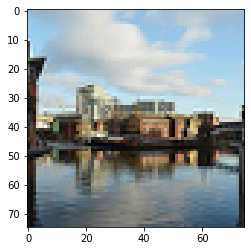

# 316   -   x_test[2519]  Prediction:  1 - buildings    Actual:  6 - street


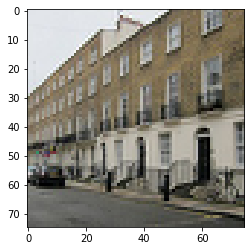

# 317   -   x_test[2532]  Prediction:  1 - buildings    Actual:  6 - street


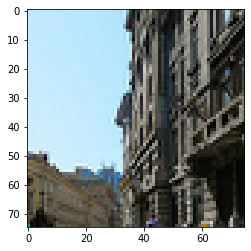

# 318   -   x_test[2535]  Prediction:  1 - buildings    Actual:  6 - street


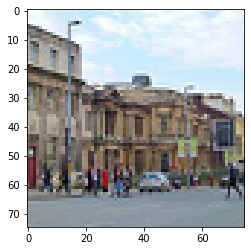

# 319   -   x_test[2556]  Prediction:  1 - buildings    Actual:  6 - street


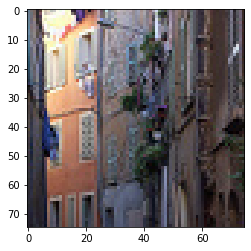

# 320   -   x_test[2566]  Prediction:  1 - buildings    Actual:  6 - street


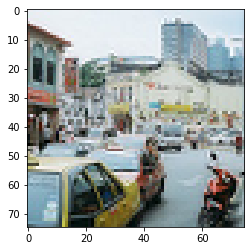

# 321   -   x_test[2585]  Prediction:  1 - buildings    Actual:  6 - street


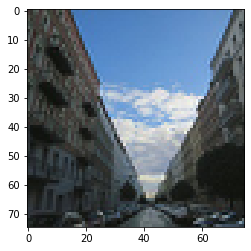

# 322   -   x_test[2588]  Prediction:  1 - buildings    Actual:  6 - street


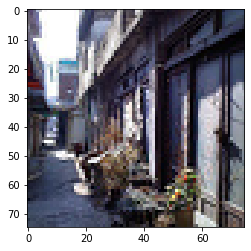

# 323   -   x_test[2596]  Prediction:  1 - buildings    Actual:  6 - street


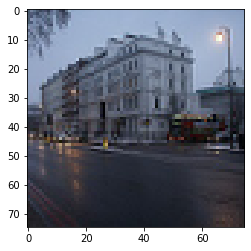

# 324   -   x_test[2607]  Prediction:  1 - buildings    Actual:  6 - street


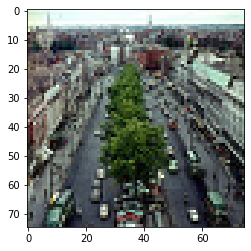

# 325   -   x_test[2613]  Prediction:  1 - buildings    Actual:  6 - street


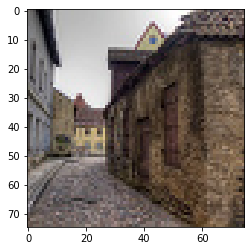

# 326   -   x_test[2620]  Prediction:  1 - buildings    Actual:  6 - street


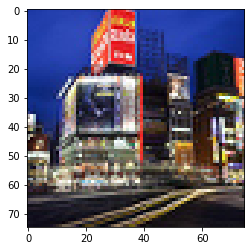

# 327   -   x_test[2638]  Prediction:  1 - buildings    Actual:  6 - street


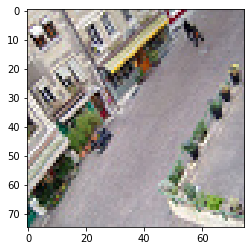

# 328   -   x_test[2653]  Prediction:  3 - glacier    Actual:  6 - street


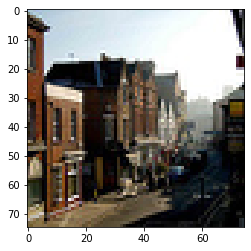

# 329   -   x_test[2672]  Prediction:  1 - buildings    Actual:  6 - street


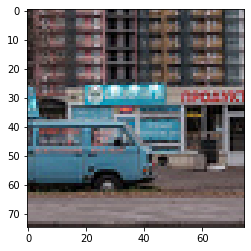

# 330   -   x_test[2680]  Prediction:  1 - buildings    Actual:  6 - street


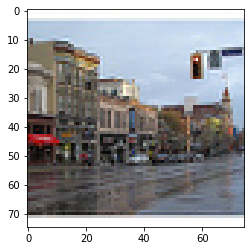

# 331   -   x_test[2707]  Prediction:  1 - buildings    Actual:  6 - street


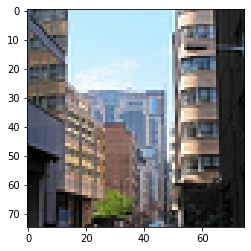

# 332   -   x_test[2709]  Prediction:  1 - buildings    Actual:  6 - street


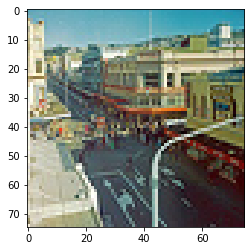

# 333   -   x_test[2712]  Prediction:  1 - buildings    Actual:  6 - street


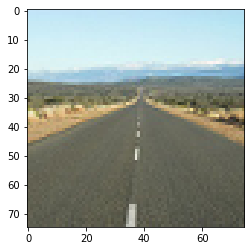

# 334   -   x_test[2721]  Prediction:  5 - sea    Actual:  6 - street


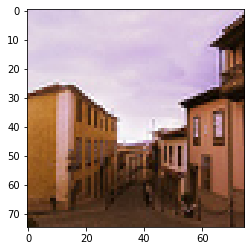

# 335   -   x_test[2740]  Prediction:  1 - buildings    Actual:  6 - street


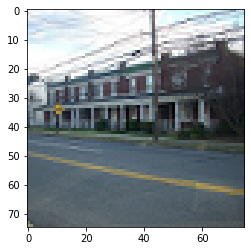

# 336   -   x_test[2744]  Prediction:  1 - buildings    Actual:  6 - street


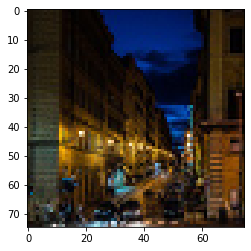

# 337   -   x_test[2748]  Prediction:  1 - buildings    Actual:  6 - street


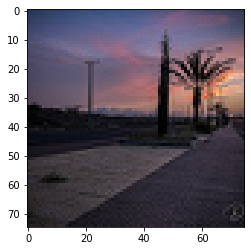

# 338   -   x_test[2749]  Prediction:  5 - sea    Actual:  6 - street


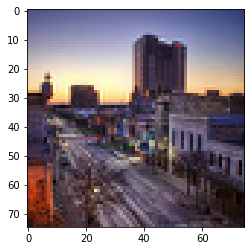

# 339   -   x_test[2757]  Prediction:  1 - buildings    Actual:  6 - street


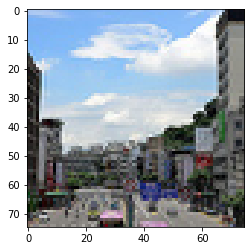

# 340   -   x_test[2761]  Prediction:  1 - buildings    Actual:  6 - street


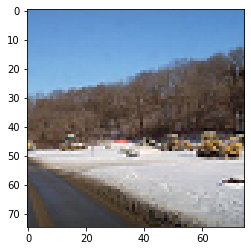

# 341   -   x_test[2778]  Prediction:  4 - mountain    Actual:  6 - street


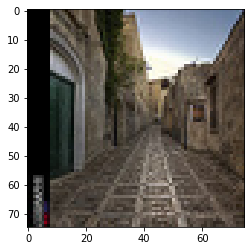

# 342   -   x_test[2787]  Prediction:  1 - buildings    Actual:  6 - street


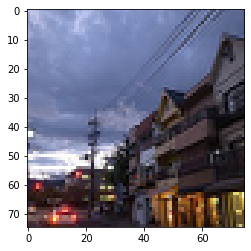

# 343   -   x_test[2804]  Prediction:  5 - sea    Actual:  6 - street


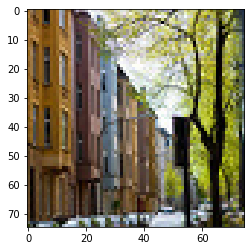

# 344   -   x_test[2805]  Prediction:  2 - forest    Actual:  6 - street


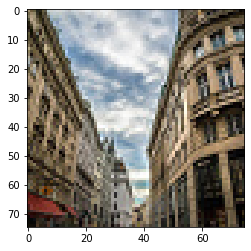

# 345   -   x_test[2812]  Prediction:  1 - buildings    Actual:  6 - street


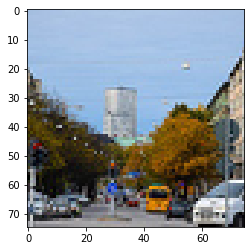

# 346   -   x_test[2816]  Prediction:  1 - buildings    Actual:  6 - street


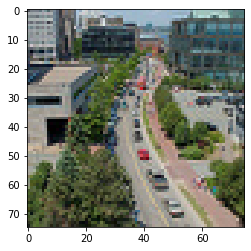

# 347   -   x_test[2817]  Prediction:  1 - buildings    Actual:  6 - street


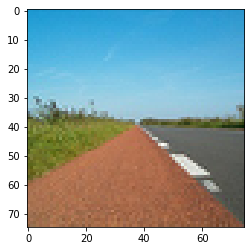

# 348   -   x_test[2820]  Prediction:  5 - sea    Actual:  6 - street


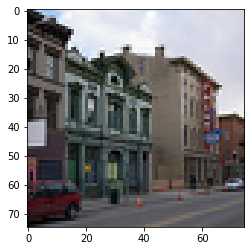

# 349   -   x_test[2827]  Prediction:  1 - buildings    Actual:  6 - street


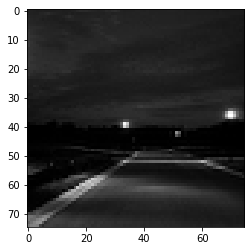

# 350   -   x_test[2830]  Prediction:  5 - sea    Actual:  6 - street


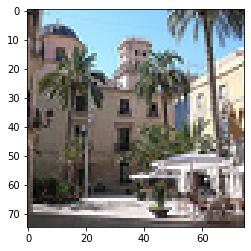

# 351   -   x_test[2838]  Prediction:  1 - buildings    Actual:  6 - street


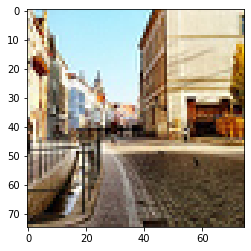

# 352   -   x_test[2843]  Prediction:  1 - buildings    Actual:  6 - street


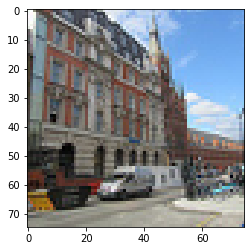

# 353   -   x_test[2858]  Prediction:  1 - buildings    Actual:  6 - street


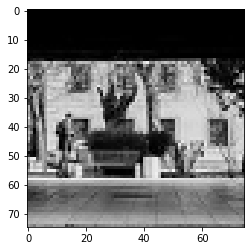

# 354   -   x_test[2859]  Prediction:  1 - buildings    Actual:  6 - street


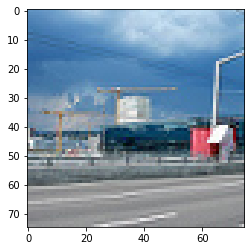

# 355   -   x_test[2862]  Prediction:  5 - sea    Actual:  6 - street


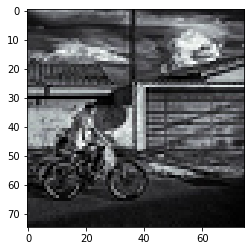

# 356   -   x_test[2884]  Prediction:  1 - buildings    Actual:  6 - street


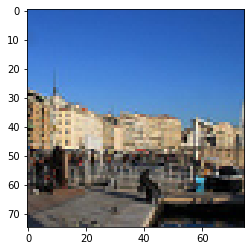

# 357   -   x_test[2892]  Prediction:  1 - buildings    Actual:  6 - street


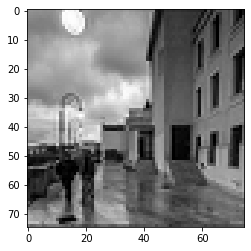

# 358   -   x_test[2894]  Prediction:  1 - buildings    Actual:  6 - street


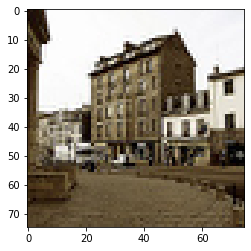

# 359   -   x_test[2895]  Prediction:  1 - buildings    Actual:  6 - street


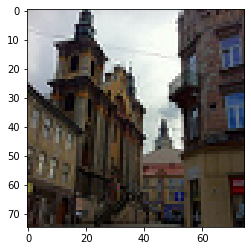

# 360   -   x_test[2901]  Prediction:  1 - buildings    Actual:  6 - street


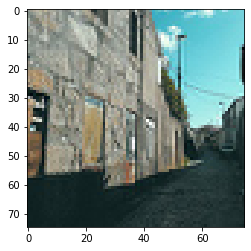

# 361   -   x_test[2905]  Prediction:  1 - buildings    Actual:  6 - street


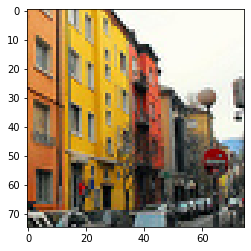

# 362   -   x_test[2920]  Prediction:  1 - buildings    Actual:  6 - street


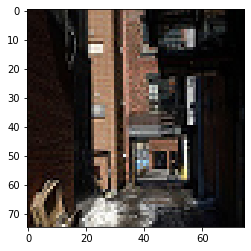

# 363   -   x_test[2921]  Prediction:  1 - buildings    Actual:  6 - street


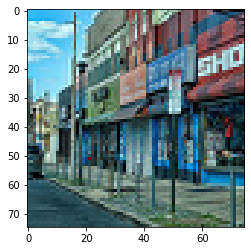

# 364   -   x_test[2949]  Prediction:  1 - buildings    Actual:  6 - street


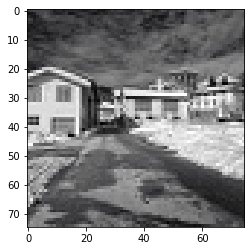

# 365   -   x_test[2951]  Prediction:  1 - buildings    Actual:  6 - street


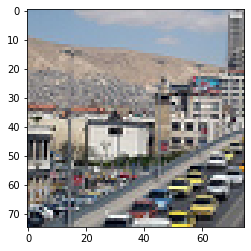

# 366   -   x_test[2954]  Prediction:  1 - buildings    Actual:  6 - street


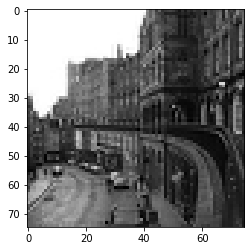

# 367   -   x_test[2960]  Prediction:  1 - buildings    Actual:  6 - street


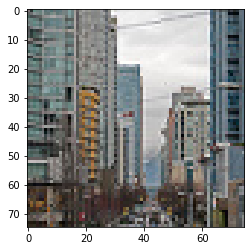

# 368   -   x_test[2962]  Prediction:  1 - buildings    Actual:  6 - street


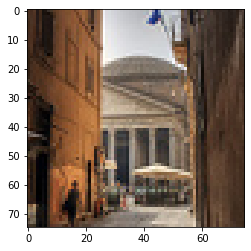

# 369   -   x_test[2964]  Prediction:  1 - buildings    Actual:  6 - street


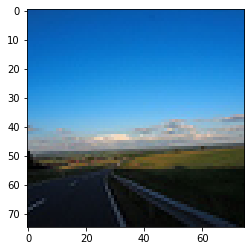

# 370   -   x_test[2972]  Prediction:  5 - sea    Actual:  6 - street


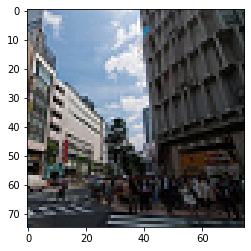

# 371   -   x_test[2976]  Prediction:  1 - buildings    Actual:  6 - street


In [8]:
y_pred = model.predict(x_test)

df_prediction = pd.DataFrame(y_pred)
y_pred_values = df_prediction.idxmax(axis=1)

y_test_values = pd.DataFrame(y_test).idxmax(axis=1)

df_match = pd.DataFrame(y_pred_values == y_test_values, columns=['match'])
wrong_indices = df_match[df_match['match']==False].index.values

for i in range(0,len(wrong_indices)):
    wrong_idx = wrong_indices[i]

    image = x_test[wrong_idx]
    plt.imshow(image)
    plt.show()
    print('#', str(i + 1), '  -  ',
          'x_test[' + str(wrong_idx) + '] ',
          'Prediction: ', y_pred_values[wrong_idx], '-', value_pair[y_pred_values[wrong_idx]],'  ',
          'Actual: ', y_test_values[wrong_idx], '-', value_pair[y_test_values[wrong_idx]])

# Visualize deep learning filters used for image

(75, 75, 3)


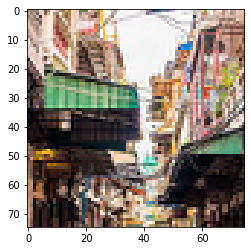

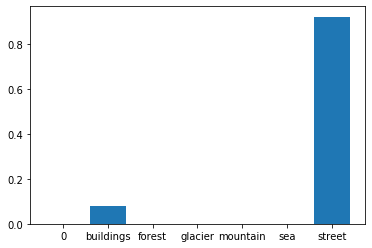

In [9]:
layer_dict = dict([(layer.name, layer) for layer in model.layers])

# import image of interest
folder_path = 'seg_pred/'
pred_list = !ls 'seg_pred/'
pred_sample = pred_list[23]
filename = folder_path + pred_sample
data = plt.imread(filename)

# plot the image of interest
image = load_img(filename)
width, height = image.size
pil_im = Image.open(filename)
pil_im.thumbnail((75, 75), Image.ANTIALIAS)
picture = np.asarray(pil_im)
print(picture.shape)

img = plt.figure(figsize=(4,4))
img = plt.imshow(picture)
img = plt.show()

# Show prediction of image classification for image of interest
picture_reshaped = np.reshape(picture, (1, picture.shape[0], picture[0].shape[0], picture[0].shape[1]))

x = np.arange(7)
predictions = model.predict(picture_reshaped)
height = list(predictions[0])

fig, ax = plt.subplots()
plt.bar(x, height)
plt.xticks(x, ('0', 'buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'))
plt.show()

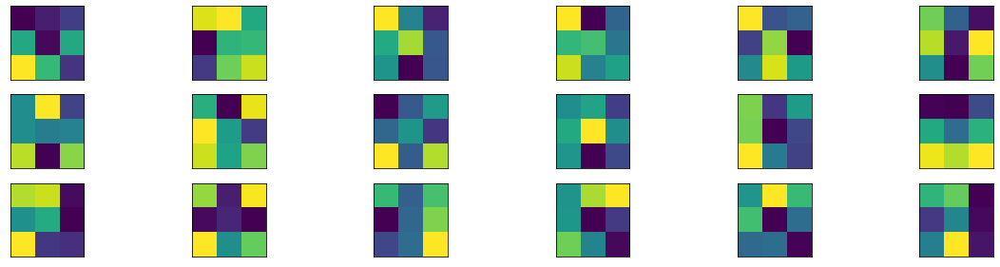

In [10]:
# State which layer to visualize
layer_name = 'conv2d_layer_7'
filter_index = 0

# Grab the filters and biases for that layer
filters, biases = layer_dict[layer_name].get_weights()

# Normalize filter values to a range of 0 to 1 so we can visualize them
f_min, f_max = np.amin(filters), np.amax(filters)
filters = (filters - f_min) / (f_max - f_min)

# Plot first few filters
n_filters, index = 6, 1
ax = plt.figure(figsize=(20,10))

for i in range(n_filters):
    f = filters[:, :, :, i]
    
    # Plot each channel separately
    for j in range(3):

        ax = plt.subplot(n_filters, 6, index)
        ax.set_xticks([])
        ax.set_yticks([])
        
        plt.imshow(f[:, :, j], cmap='viridis')
        index += 1
        
plt.show()

# Visualizing feature maps

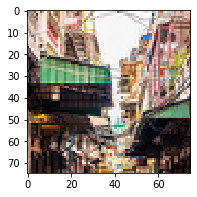

conv2d_layer_1:


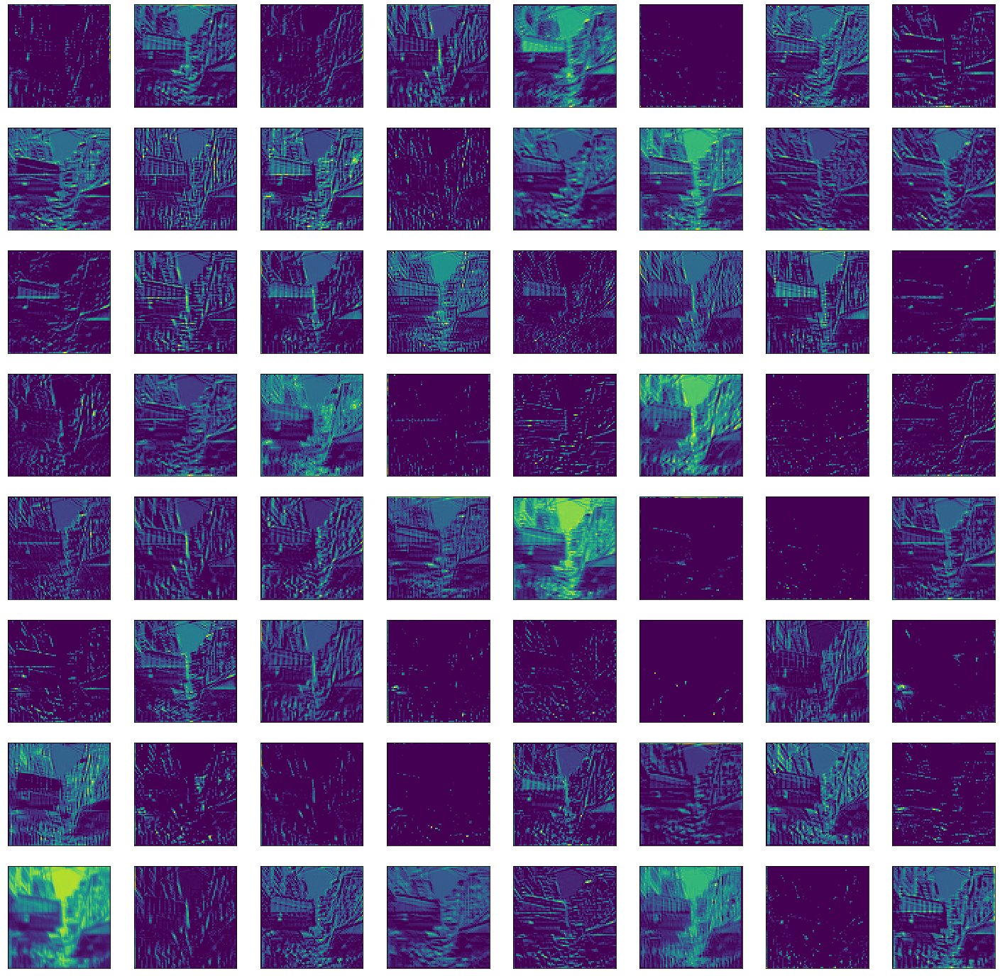

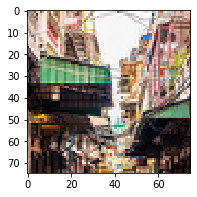

conv2d_layer_2:


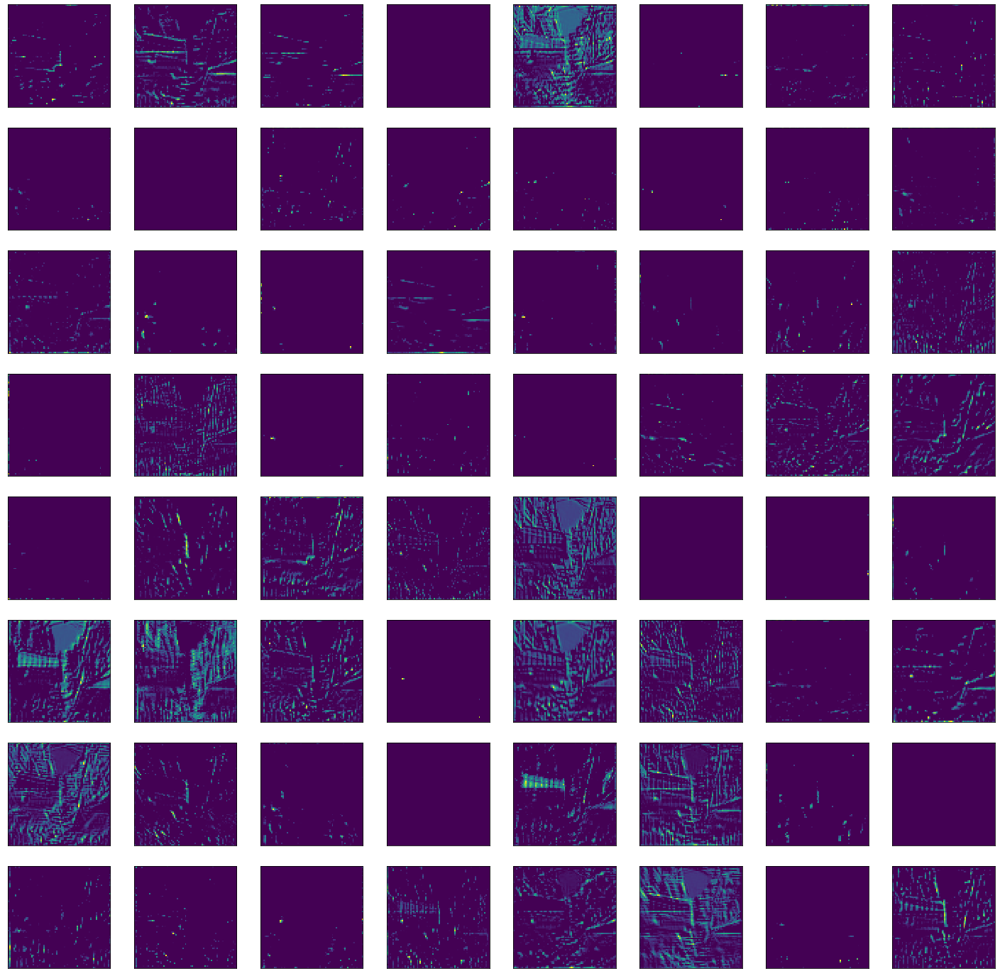

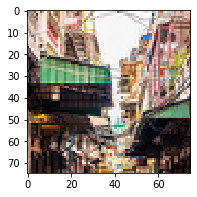

conv2d_layer_2b:


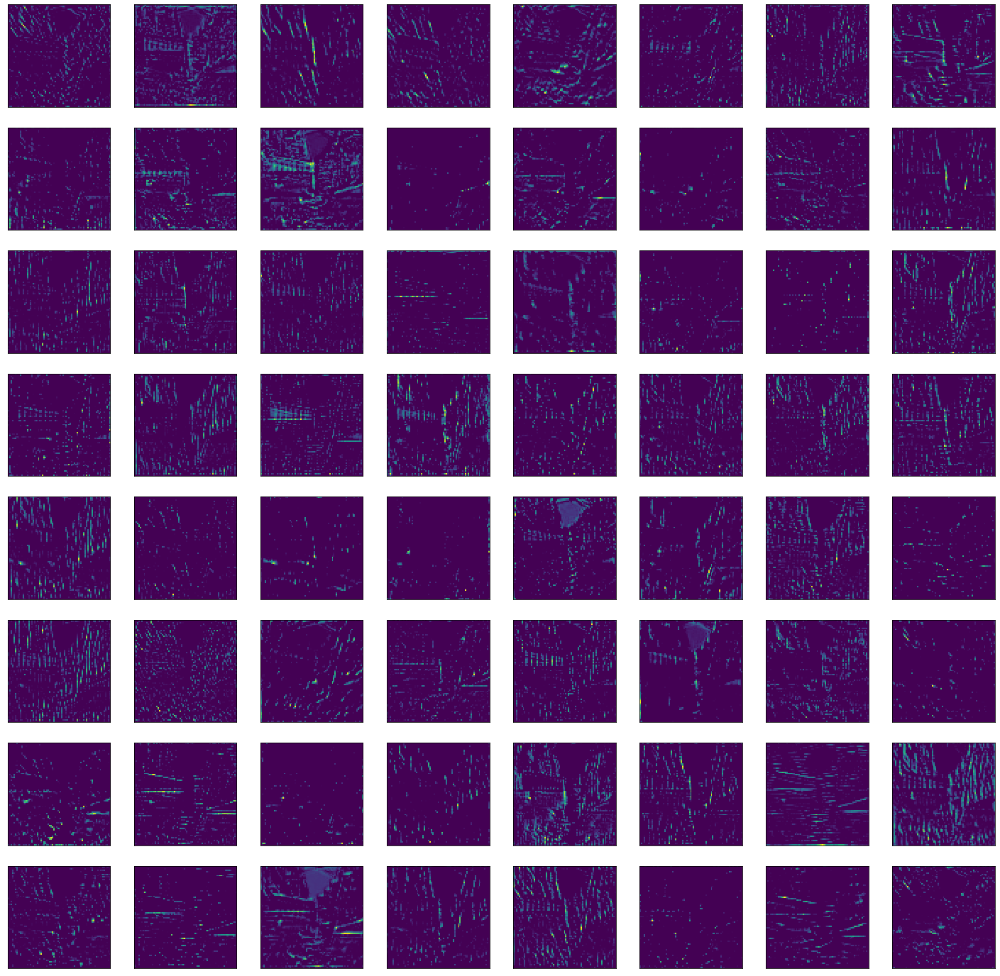

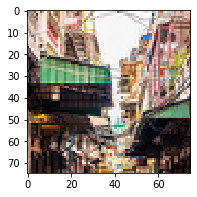

conv2d_layer_3:


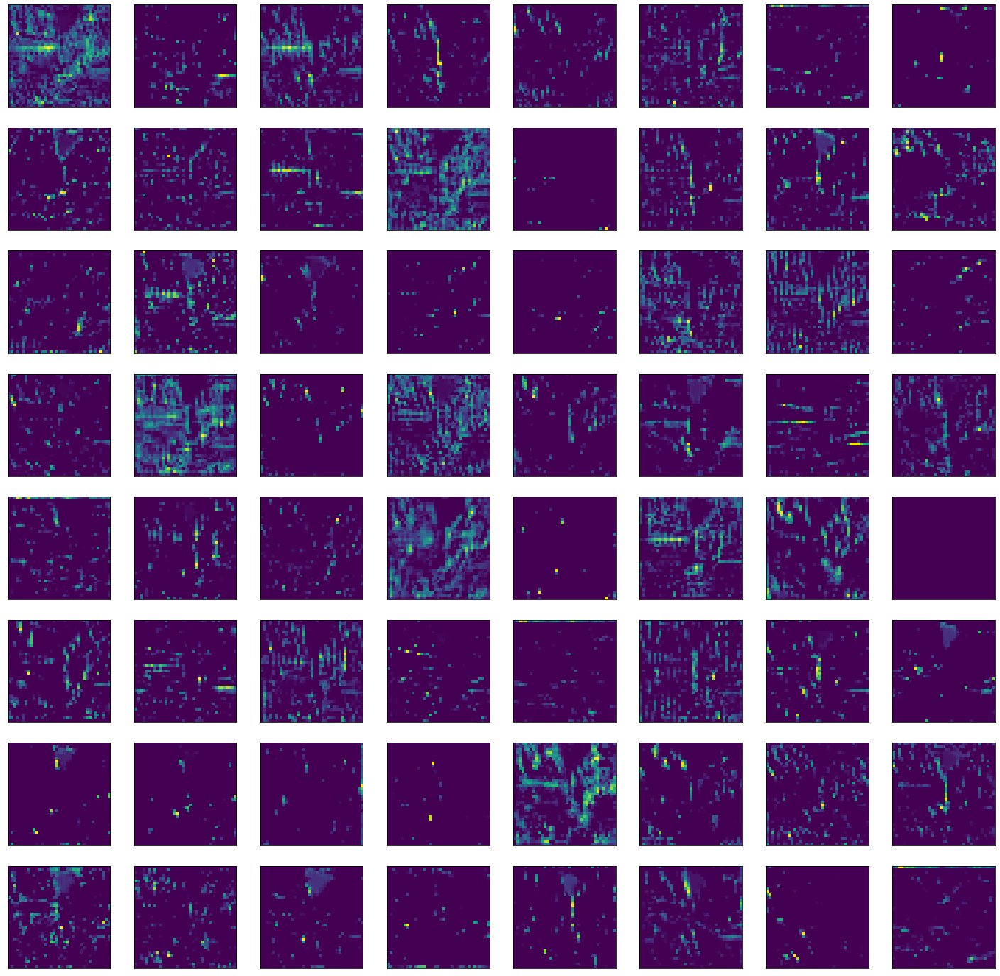

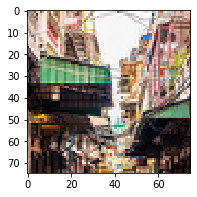

conv2d_layer_4:


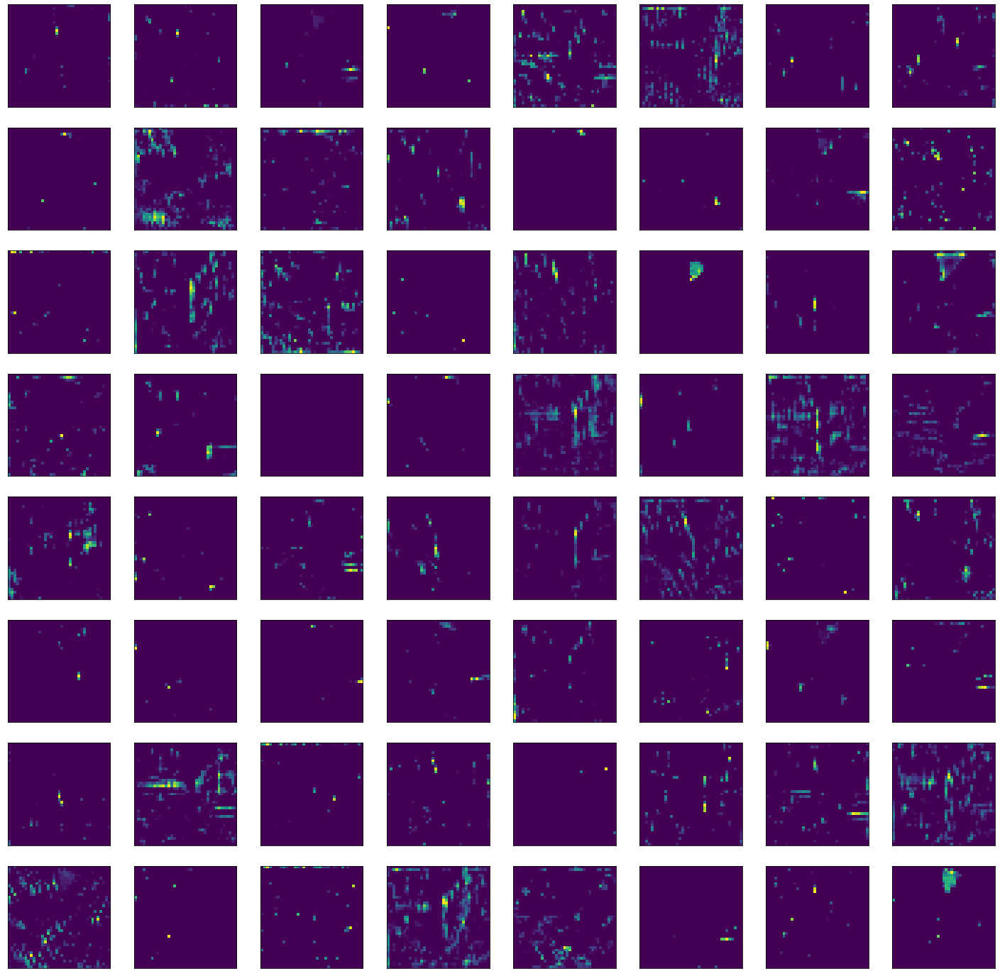

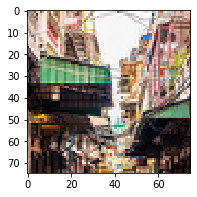

conv2d_layer_5:


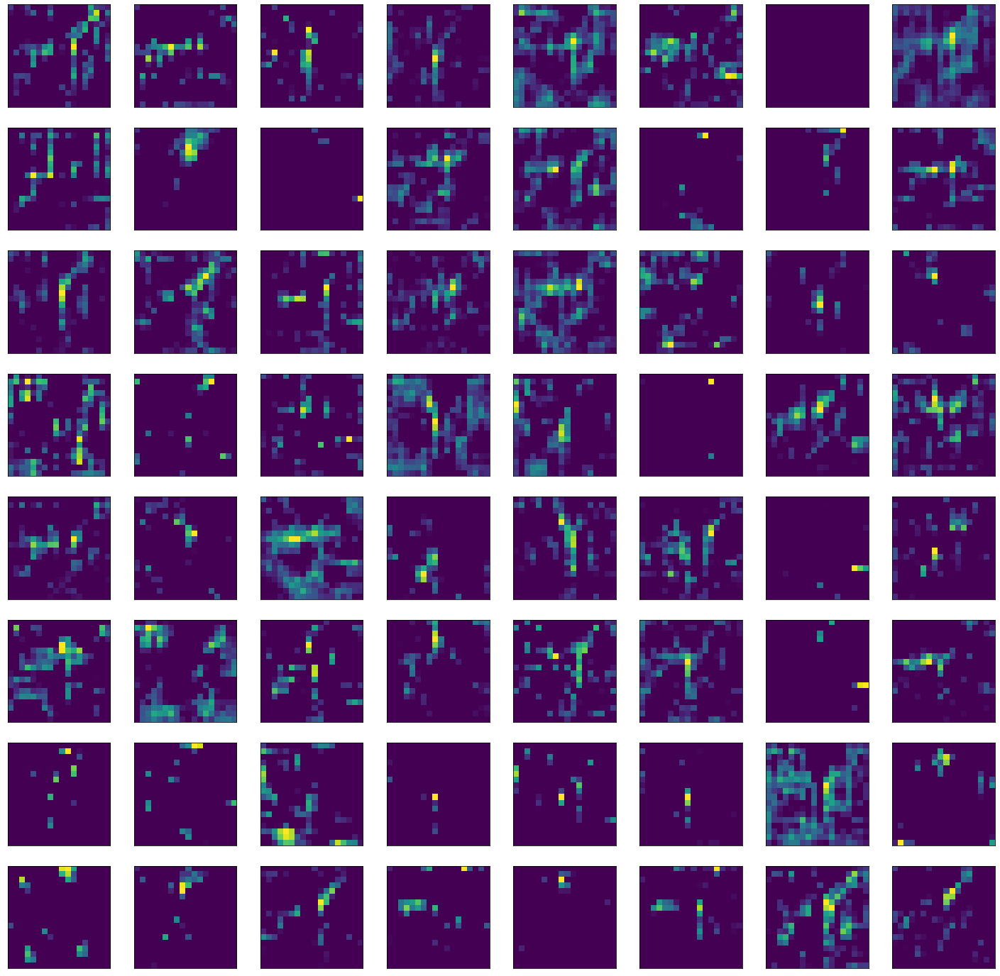

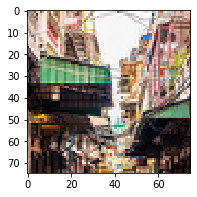

conv2d_layer_7:


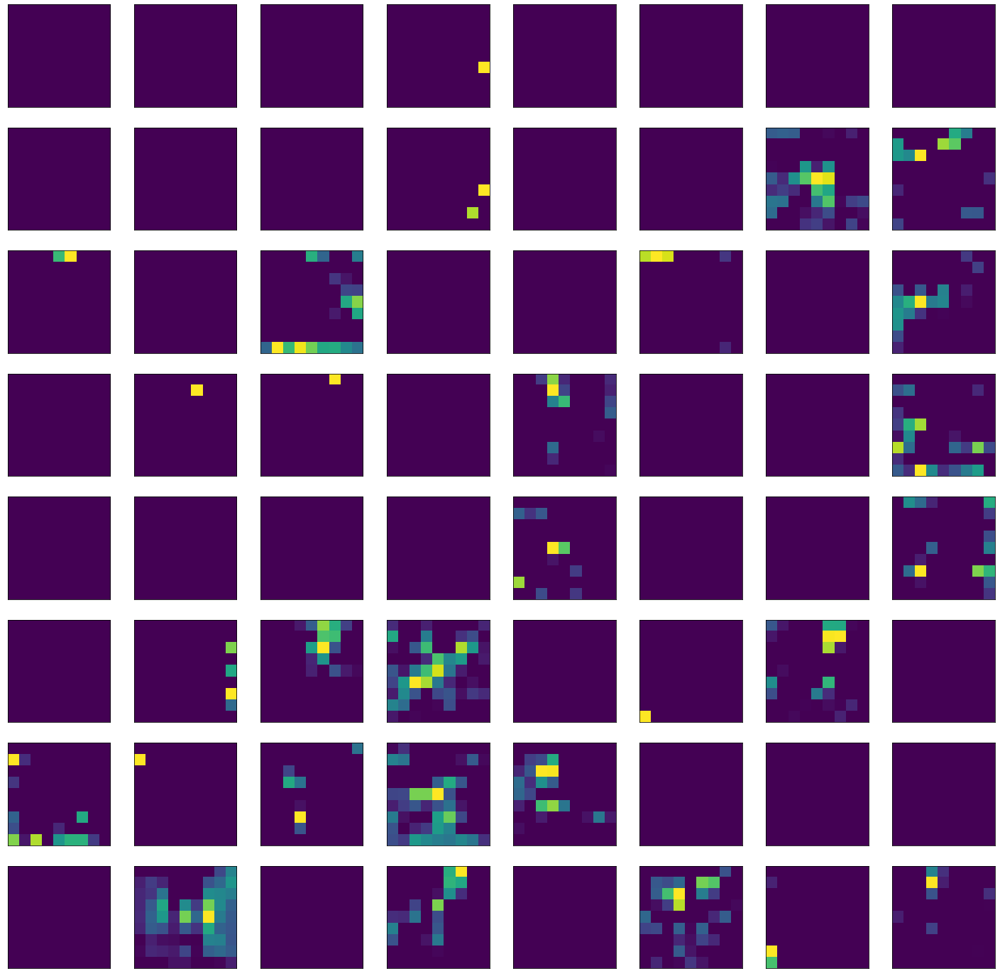

In [11]:
# Layers to visualize
cnn_layers = ['conv2d_layer_1',
              'conv2d_layer_2',
              'conv2d_layer_2b',
              'conv2d_layer_3', 
              'conv2d_layer_4', 
              'conv2d_layer_5', 
              'conv2d_layer_7'
             ]

# For loop to visualize how the filters are used at each layer
for layer_name in cnn_layers:
    
    img = plt.figure(figsize=(3,3))
    img = plt.imshow(picture)
    img = plt.show()
    
    submodel = Model(inputs=model.inputs, outputs=layer_dict[layer_name].output)

    # Prepare the image
    image = np.expand_dims(picture, axis=0)

    # Apply the model to the image
    feature_maps = submodel.predict(image)

    square = 8
    index = 1

    print(layer_name + ':')
    ax = plt.figure(figsize=(25,25))

    for _ in range(square):
        for _ in range(square):

            ax = plt.subplot(square, square, index)
            ax.set_xticks([])
            ax.set_yticks([])

            image_layer_2 = plt.imshow(feature_maps[0, :, :, index-1], cmap='viridis')

            index += 1

    plt.show()

# IMPLEMENTING YOLO3 OBJECT DETECTION
## Transfer learning: Use YOLO3 to detect objects within a group of pictures

In [12]:
## FUNCTIONS USED FOR YOLO3 OBJECT DETECTION

# Create a YOLOv3 Keras model and save it to file
def _conv_block(inp, convs, skip=True):
    x = inp
    count = 0
    for conv in convs:
        if count == (len(convs) - 2) and skip:
            skip_connection = x
        count += 1
        if conv['stride'] > 1: x = ZeroPadding2D(((1,0),(1,0)))(x) # peculiar padding as darknet prefer left and top
        x = Conv2D(conv['filter'],
                   conv['kernel'],
                   strides=conv['stride'],
                   padding='valid' if conv['stride'] > 1 else 'same', # peculiar padding as darknet prefer left and top
                   name='conv_' + str(conv['layer_idx']),
                   use_bias=False if conv['bnorm'] else True)(x)
        if conv['bnorm']: x = BatchNormalization(epsilon=0.001, name='bnorm_' + str(conv['layer_idx']))(x)
        if conv['leaky']: x = LeakyReLU(alpha=0.1, name='leaky_' + str(conv['layer_idx']))(x)
    return add([skip_connection, x]) if skip else x

def make_yolov3_model():
    input_image = Input(shape=(None, None, 3))
    # Layer  0 => 4
    x = _conv_block(input_image, [{'filter': 32, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 0},
                                  {'filter': 64, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 1},
                                  {'filter': 32, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 2},
                                  {'filter': 64, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 3}])
    # Layer  5 => 8
    x = _conv_block(x, [{'filter': 128, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 5},
                        {'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 6},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 7}])
    # Layer  9 => 11
    x = _conv_block(x, [{'filter':  64, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 9},
                        {'filter': 128, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 10}])
    # Layer 12 => 15
    x = _conv_block(x, [{'filter': 256, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 12},
                        {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 13},
                        {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 14}])
    # Layer 16 => 36
    for i in range(7):
        x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 16+i*3},
                            {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 17+i*3}])
    skip_36 = x
    # Layer 37 => 40
    x = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 37},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 38},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 39}])
    # Layer 41 => 61
    for i in range(7):
        x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 41+i*3},
                            {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 42+i*3}])
    skip_61 = x
    # Layer 62 => 65
    x = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 2, 'bnorm': True, 'leaky': True, 'layer_idx': 62},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 63},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 64}])
    # Layer 66 => 74
    for i in range(3):
        x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 66+i*3},
                            {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 67+i*3}])
    # Layer 75 => 79
    x = _conv_block(x, [{'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 75},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 76},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 77},
                        {'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 78},
                        {'filter':  512, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 79}], skip=False)
    # Layer 80 => 82
    yolo_82 = _conv_block(x, [{'filter': 1024, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 80},
                              {'filter':  255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 81}], skip=False)
    # Layer 83 => 86
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 84}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_61])
    # Layer 87 => 91
    x = _conv_block(x, [{'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 87},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 88},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 89},
                        {'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 90},
                        {'filter': 256, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True, 'layer_idx': 91}], skip=False)
    # Layer 92 => 94
    yolo_94 = _conv_block(x, [{'filter': 512, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 92},
                              {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 93}], skip=False)
    # Layer 95 => 98
    x = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True, 'leaky': True,   'layer_idx': 96}], skip=False)
    x = UpSampling2D(2)(x)
    x = concatenate([x, skip_36])
    # Layer 99 => 106
    yolo_106 = _conv_block(x, [{'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 99},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 100},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 101},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 102},
                               {'filter': 128, 'kernel': 1, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 103},
                               {'filter': 256, 'kernel': 3, 'stride': 1, 'bnorm': True,  'leaky': True,  'layer_idx': 104},
                               {'filter': 255, 'kernel': 1, 'stride': 1, 'bnorm': False, 'leaky': False, 'layer_idx': 105}], skip=False)
    model = Model(input_image, [yolo_82, yolo_94, yolo_106])
    return model

class WeightReader:
    def __init__(self, weight_file):
        with open(weight_file, 'rb') as w_f:
            major,	= struct.unpack('i', w_f.read(4))
            minor,	= struct.unpack('i', w_f.read(4))
            revision, = struct.unpack('i', w_f.read(4))
            if (major*10 + minor) >= 2 and major < 1000 and minor < 1000:
                w_f.read(8)
            else:
                w_f.read(4)
            transpose = (major > 1000) or (minor > 1000)
            binary = w_f.read()
        self.offset = 0
        self.all_weights = np.frombuffer(binary, dtype='float32')

    def read_bytes(self, size):
        self.offset = self.offset + size
        return self.all_weights[self.offset-size:self.offset]

    def load_weights(self, model):
        for i in range(106):
            try:
                conv_layer = model.get_layer('conv_' + str(i))
                print("loading weights of convolution #" + str(i))
                if i not in [81, 93, 105]:
                    norm_layer = model.get_layer('bnorm_' + str(i))
                    size = np.prod(norm_layer.get_weights()[0].shape)
                    beta  = self.read_bytes(size) # bias
                    gamma = self.read_bytes(size) # scale
                    mean  = self.read_bytes(size) # mean
                    var   = self.read_bytes(size) # variance
                    weights = norm_layer.set_weights([gamma, beta, mean, var])
                if len(conv_layer.get_weights()) > 1:
                    bias   = self.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel, bias])
                else:
                    kernel = self.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
                    kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
                    kernel = kernel.transpose([2,3,1,0])
                    conv_layer.set_weights([kernel])
            except ValueError:
                print("no convolution #" + str(i))

    def reset(self):
        self.offset = 0

# load yolov3 model and perform object detection
class BoundBox:
    def __init__(self, xmin, ymin, xmax, ymax, objness = None, classes = None):
        self.xmin = xmin
        self.ymin = ymin
        self.xmax = xmax
        self.ymax = ymax
        self.objness = objness
        self.classes = classes
        self.label = -1
        self.score = -1

    def get_label(self):
        if self.label == -1:
            self.label = np.argmax(self.classes)

        return self.label

    def get_score(self):
        if self.score == -1:
            self.score = self.classes[self.get_label()]

        return self.score

def _sigmoid(x):
    return 1. / (1. + np.exp(-x))

def decode_netout(netout, anchors, obj_thresh, net_h, net_w):
    grid_h, grid_w = netout.shape[:2]
    nb_box = 3
    netout = netout.reshape((grid_h, grid_w, nb_box, -1))
    nb_class = netout.shape[-1] - 5
    boxes = []
    netout[..., :2]  = _sigmoid(netout[..., :2])
    netout[..., 4:]  = _sigmoid(netout[..., 4:])
    netout[..., 5:]  = netout[..., 4][..., np.newaxis] * netout[..., 5:]
    netout[..., 5:] *= netout[..., 5:] > obj_thresh

    for i in range(grid_h*grid_w):
        row = i / grid_w
        col = i % grid_w
        for b in range(nb_box):
            # 4th element is objectness score
            objectness = netout[int(row)][int(col)][b][4]
            if(objectness.all() <= obj_thresh): continue
            # first 4 elements are x, y, w, and h
            x, y, w, h = netout[int(row)][int(col)][b][:4]
            x = (col + x) / grid_w # center position, unit: image width
            y = (row + y) / grid_h # center position, unit: image height
            w = anchors[2 * b + 0] * np.exp(w) / net_w # unit: image width
            h = anchors[2 * b + 1] * np.exp(h) / net_h # unit: image height
            # last elements are class probabilities
            classes = netout[int(row)][col][b][5:]
            box = BoundBox(x-w/2, y-h/2, x+w/2, y+h/2, objectness, classes)
            boxes.append(box)
    return boxes

def correct_yolo_boxes(boxes, image_h, image_w, net_h, net_w):
    new_w, new_h = net_w, net_h
    for i in range(len(boxes)):
        x_offset, x_scale = (net_w - new_w)/2./net_w, float(new_w)/net_w
        y_offset, y_scale = (net_h - new_h)/2./net_h, float(new_h)/net_h
        boxes[i].xmin = int((boxes[i].xmin - x_offset) / x_scale * image_w)
        boxes[i].xmax = int((boxes[i].xmax - x_offset) / x_scale * image_w)
        boxes[i].ymin = int((boxes[i].ymin - y_offset) / y_scale * image_h)
        boxes[i].ymax = int((boxes[i].ymax - y_offset) / y_scale * image_h)

def _interval_overlap(interval_a, interval_b):
    x1, x2 = interval_a
    x3, x4 = interval_b
    if x3 < x1:
        if x4 < x1:
            return 0
        else:
            return min(x2,x4) - x1
    else:
        if x2 < x3:
            return 0
        else:
            return min(x2,x4) - x3

def bbox_iou(box1, box2):
    intersect_w = _interval_overlap([box1.xmin, box1.xmax], [box2.xmin, box2.xmax])
    intersect_h = _interval_overlap([box1.ymin, box1.ymax], [box2.ymin, box2.ymax])
    intersect = intersect_w * intersect_h
    w1, h1 = box1.xmax-box1.xmin, box1.ymax-box1.ymin
    w2, h2 = box2.xmax-box2.xmin, box2.ymax-box2.ymin
    union = w1*h1 + w2*h2 - intersect
    return float(intersect) / union

def do_nms(boxes, nms_thresh):
    if len(boxes) > 0:
        nb_class = len(boxes[0].classes)
    else:
        return
    for c in range(nb_class):
        sorted_indices = np.argsort([-box.classes[c] for box in boxes])
        for i in range(len(sorted_indices)):
            index_i = sorted_indices[i]
            if boxes[index_i].classes[c] == 0: continue
            for j in range(i+1, len(sorted_indices)):
                index_j = sorted_indices[j]
                if bbox_iou(boxes[index_i], boxes[index_j]) >= nms_thresh:
                    boxes[index_j].classes[c] = 0

# load and prepare an image
def load_image_pixels(filename, shape):
    # load the image to get its shape
    image = load_img(filename)
    width, height = image.size
    # load the image with the required size
    image = load_img(filename, target_size=shape)
    # convert to numpy array
    image = img_to_array(image)
    # scale pixel values to [0, 1]
    image = image.astype('float32')
    image /= 255.0
    # add a dimension so that we have one sample
    image = np.expand_dims(image, 0)
    return image, width, height

# get all of the results above a threshold
def get_boxes(boxes, labels, thresh):
    v_boxes, v_labels, v_scores = list(), list(), list()
    # enumerate all boxes
    for box in boxes:
        # enumerate all possible labels
        for i in range(len(labels)):
            # check if the threshold for this label is high enough
            if box.classes[i] > thresh:
                v_boxes.append(box)
                v_labels.append(labels[i])
                v_scores.append(box.classes[i]*100)
                # don't break, many labels may trigger for one box
    return v_boxes, v_labels, v_scores

# draw all results
def draw_boxes(filename, v_boxes, v_labels, v_scores):
    # load the image
    data = plt.imread(filename)
    # plot the image
    plt.imshow(data)
    # get the context for drawing boxes
    ax = plt.gca()
    # plot each box
    for i in range(len(v_boxes)):
        box = v_boxes[i]
        # get coordinates
        y1, x1, y2, x2 = box.ymin, box.xmin, box.ymax, box.xmax
        # calculate width and height of the box
        width, height = x2 - x1, y2 - y1
        # create the shape
        rect = Rectangle((x1, y1), width, height, fill=False, color='white')
        # draw the box
        ax.add_patch(rect)
        # draw text and score in top left corner
        label = "%s (%.3f)" % (v_labels[i], v_scores[i])
        plt.text(x1, y1, label, color='white')
    # show the plot
    plt.show()

In [13]:
# define the model
model = make_yolov3_model()

# load the model weights
weight_reader = WeightReader('yolo/yolov3.weights')

# set the model weights into the model
weight_reader.load_weights(model)

# save the model to file
model.save('yolo/model.h5')

loading weights of convolution #0
loading weights of convolution #1
loading weights of convolution #2
loading weights of convolution #3
no convolution #4
loading weights of convolution #5
loading weights of convolution #6
loading weights of convolution #7
no convolution #8
loading weights of convolution #9
loading weights of convolution #10
no convolution #11
loading weights of convolution #12
loading weights of convolution #13
loading weights of convolution #14
no convolution #15
loading weights of convolution #16
loading weights of convolution #17
no convolution #18
loading weights of convolution #19
loading weights of convolution #20
no convolution #21
loading weights of convolution #22
loading weights of convolution #23
no convolution #24
loading weights of convolution #25
loading weights of convolution #26
no convolution #27
loading weights of convolution #28
loading weights of convolution #29
no convolution #30
loading weights of convolution #31
loading weights of convolution #32

/Users/jeromegonzaga/opt/anaconda3/lib/python3.7/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


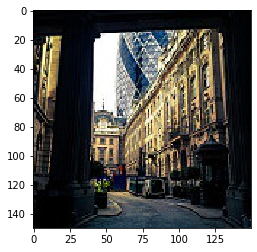

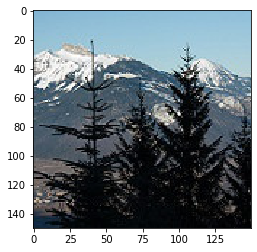

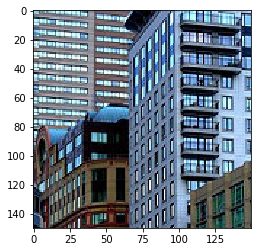

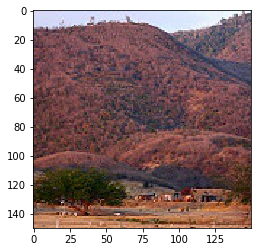

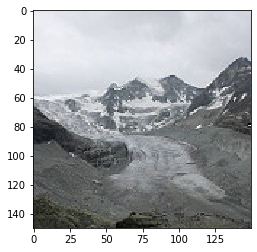

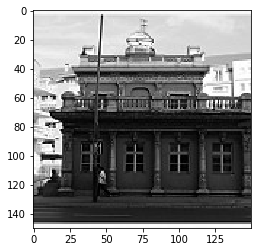

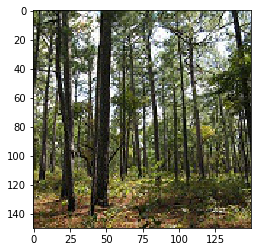

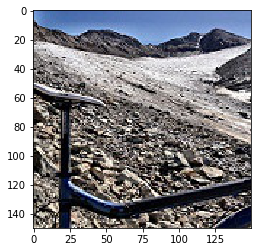

person 96.04524970054626


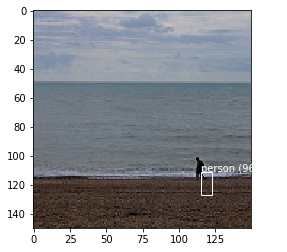

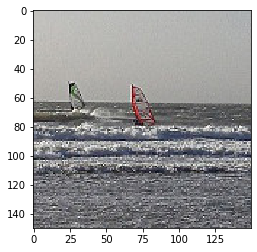

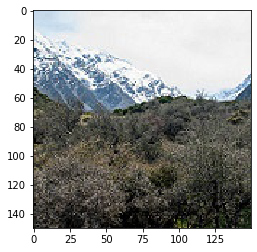

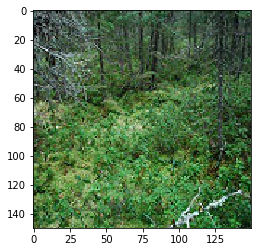

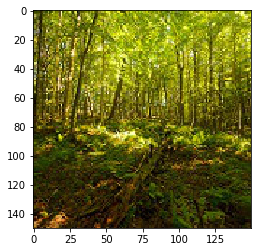

clock 92.81538128852844


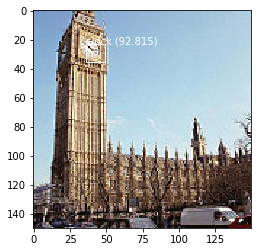

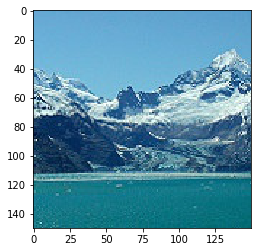

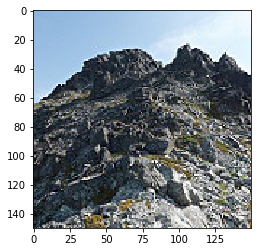

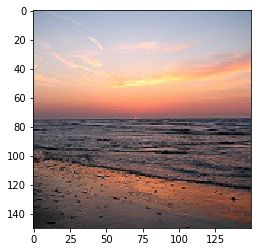

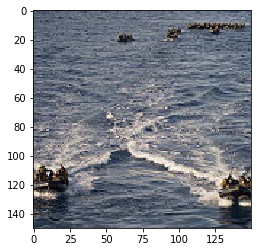

car 61.808305978775024


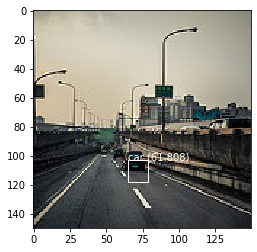

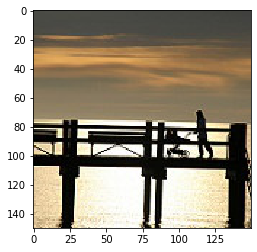

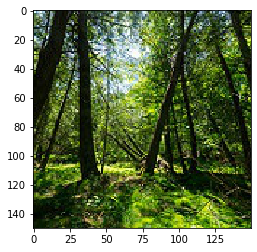

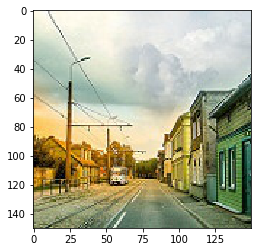

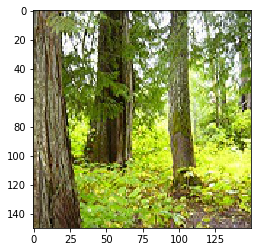

person 77.0334005355835


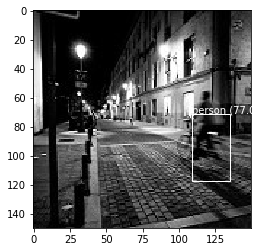

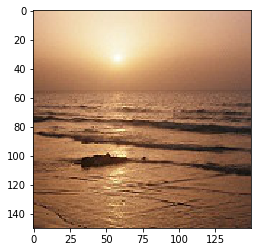

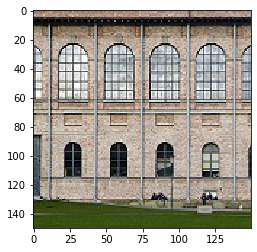

bench 96.14778757095337


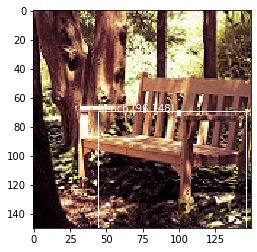

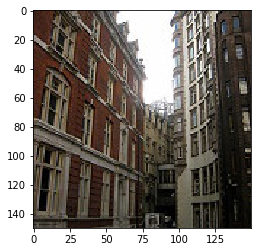

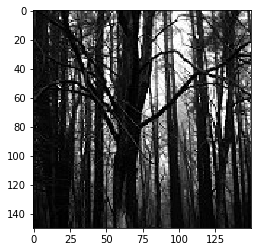

car 87.8006100654602
car 73.55424165725708
car 79.83420491218567
car 75.17759203910828
car 92.50024557113647
car 91.8577790260315
car 96.94603681564331
car 97.3646879196167


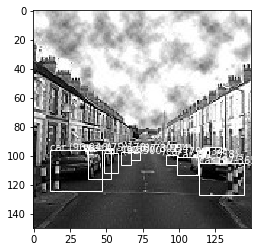

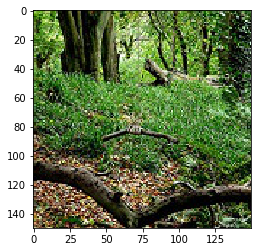

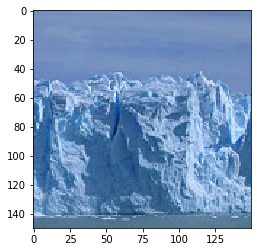

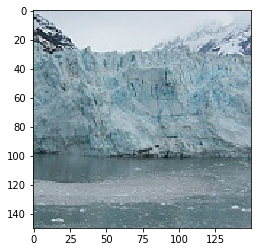

person 95.19894123077393


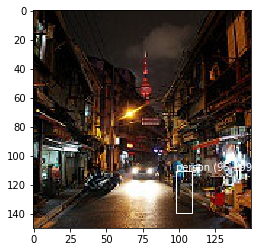

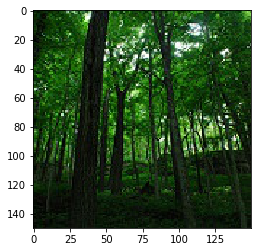

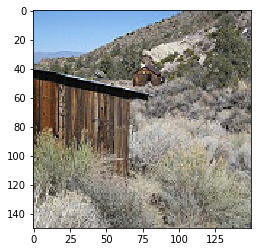

person 90.05368947982788
person 66.01929664611816


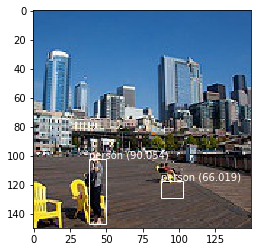

car 83.56098532676697
car 87.76140213012695


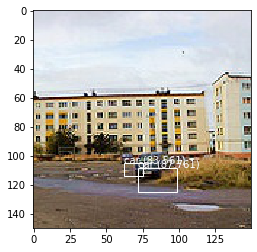

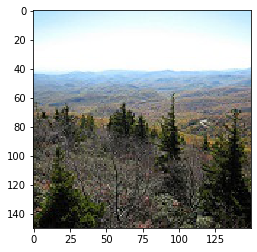

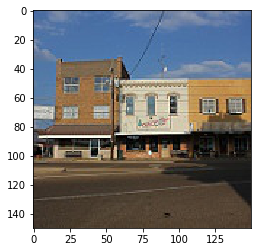

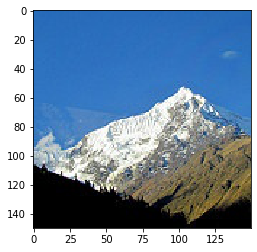

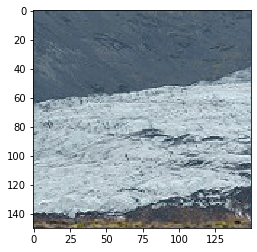

person 98.70293736457825


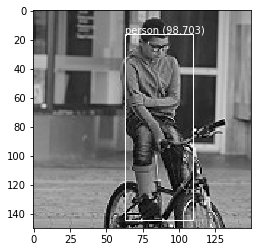

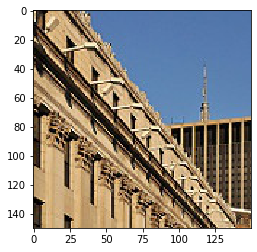

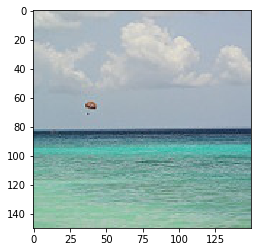

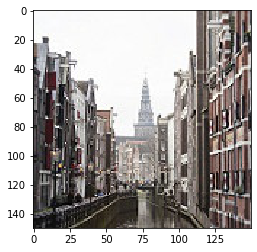

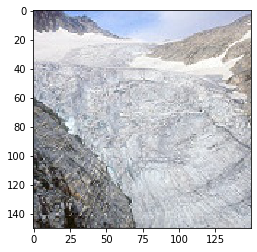

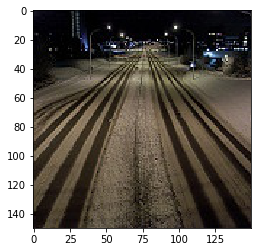

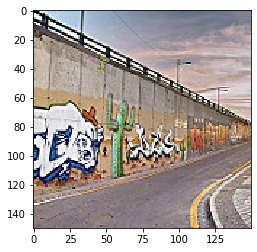

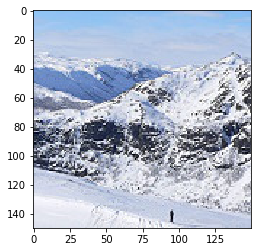

In [14]:
# load yolov3 model
model = load_model('yolo/model.h5')

# load prediction photos
for photo_num in range(200,250):
    pred_sample = pred_list[photo_num]
    filename = folder_path + pred_sample

    image = load_img(filename)
    width, height = image.size

    # define the expected input shape for the model
    input_w, input_h = width, height
    # define our new photo
    photo_filename = filename
    # load and prepare image
    image, image_w, image_h = load_image_pixels(photo_filename, (input_w, input_h))
    # make prediction
    yhat = model.predict(image)
    
    # define the anchors
    anchors = [[116,90, 156,198, 373,326], [30,61, 62,45, 59,119], [10,13, 16,30, 33,23]]
    
    # define the probability threshold for detected objects
    class_threshold = 0.6
    boxes = list()
    for i in range(len(yhat)):
        # decode the output of the network
        boxes += decode_netout(yhat[i][0], anchors[i], class_threshold, input_h, input_w)
    
    # correct the sizes of the bounding boxes for the shape of the image
    correct_yolo_boxes(boxes, image_h, image_w, input_h, input_w)
    
    # suppress non-maximal boxes
    do_nms(boxes, 0.5)
    
    # define the labels
    labels = ["person", "bicycle", "car", "motorbike", "airplane", "bus", "train", "truck",
        "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench",
        "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
        "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard",
        "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard",
        "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana",
        "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake",
        "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse",
        "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
        "book", "clock", "vase", "scissors", "teddy bear", "hair dryer", "toothbrush"]
    
    # get the details of the detected objects
    v_boxes, v_labels, v_scores = get_boxes(boxes, labels, class_threshold)
    
    # summarize what we found
    for i in range(len(v_boxes)):
        print(v_labels[i], v_scores[i])
    
    # draw what we found
    draw_boxes(photo_filename, v_boxes, v_labels, v_scores)